# Code-Capacity Trace Of Disordered Damping Coefficients

This mirrors the signed-memory trace notebook cell-for-cell as closely as possible, but the perturbation now lives on check-to-bit damping messages. The two random families separate global edge disorder from stabilizer-support-local disorder.


In [1]:
import importlib
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display


In [2]:
def find_repo_root(start: Path) -> Path:
    for candidate in (start, *start.parents):
        if (candidate / "pyproject.toml").exists() and (candidate / "src" / "relay_bp").exists():
            return candidate
    raise FileNotFoundError("Could not locate the relay repo root from the current working directory.")


REPO_ROOT = find_repo_root(Path.cwd())
SRC_ROOT = REPO_ROOT / "src"
if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))

from relay_bp.analysis.code_capacity_common import default_export_code_paths

CODE_PATHS = {
    "hgp_625": Path(r"C:\Users\User\Documents\projects-git\giulio\hgp_code_625_25_6_peg.npz"),
    "hgp_225": Path(r"C:\Users\User\Documents\cluster_decoder\cluster_decoder\codes\hgp_code_225.npz"),
    "surface5": Path(r"C:\Users\User\Documents\Code from BPGD\surface5_HxHzLxLz.npz"),
    "surface13": Path(r"C:\Users\User\Documents\Code from BPGD\surface13_HxHzLxLz.npz"),
    "B1": Path(r"C:\Users\User\Documents\projects-git\bpgd_low_llr_and_hybrid\B1_HxHzLxLz.npz"),
    "gross": Path(r"C:\Users\User\Documents\projects-git\bpgd_low_llr_and_hybrid\gross_HxHzLxLz.npz"),
    "two_gross": Path(r"C:\Users\User\Documents\projects-git\bpgd_low_llr_and_hybrid\two_gross_HxHzLxLz.npz"),
}

selected_code = "gross"  # change here
npz_path = CODE_PATHS[selected_code]

prior_error_rate = 0.10
max_iter = 40
alpha = 1.0
same_damping_coefficient = 0.75
random_damping_interval = (0.50, 1.00)
random_coefficient_seed_offsets = [0, 1, 2]
core_seed_zero = 0
core_seed_grid = list(range(1, 11))

DECODER_SPECS = {
    "bp": {
        "label": "Vanilla BP",
        "coeff_seed_offsets": [0],
    },
    "damp_same": {
        "label": "Damp-BP / same coefficient",
        "coeff_seed_offsets": [0],
    },
    "damp_random_all_edges": {
        "label": "Damp-BP / random interval on all edges",
        "coeff_seed_offsets": random_coefficient_seed_offsets,
    },
    "damp_random_support_only": {
        "label": "Damp-BP / random interval on stabilizer support",
        "coeff_seed_offsets": random_coefficient_seed_offsets,
    },
}


c:\Users\User\Documents\projects-git\relay_mother_folder\relay\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


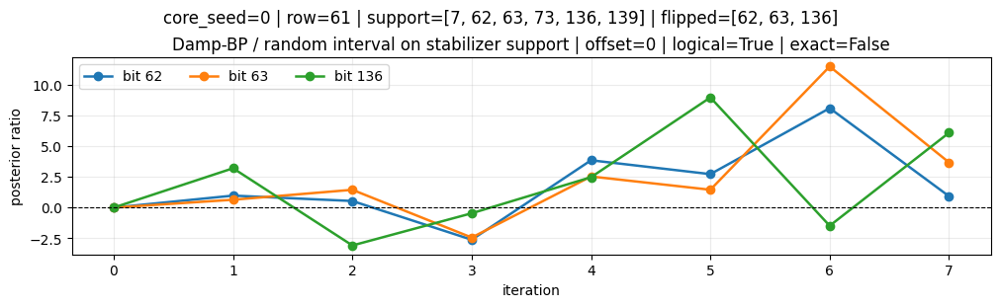

In [3]:
import importlib
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


def find_repo_root(start: Path) -> Path:
    for candidate in (start, *start.parents):
        if (candidate / "pyproject.toml").exists() and (candidate / "src" / "relay_bp").exists():
            return candidate
    raise FileNotFoundError("Could not locate the relay repo root from the current working directory.")


REPO_ROOT = globals().get("REPO_ROOT", find_repo_root(Path.cwd()))
SRC_ROOT = REPO_ROOT / "src"
if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))

import relay_bp.analysis.code_capacity_common as code_capacity_common_module

importlib.reload(code_capacity_common_module)

from relay_bp.analysis.code_capacity_common import (
    build_edge_damping_messages,
    build_half_stabilizer_case_from_seed,
    default_export_code_paths,
    evaluate_decode_result,
    load_code_capacity_problem,
    make_min_sum_tracer,
)

CODE_PATHS = globals().get("CODE_PATHS", default_export_code_paths(REPO_ROOT))
selected_code = globals().get("selected_code", "gross")
npz_path = globals().get("npz_path", CODE_PATHS[selected_code])
prior_error_rate = float(globals().get("prior_error_rate", 0.10))
max_iter = int(globals().get("max_iter", 40))
alpha = float(globals().get("alpha", 1.0))
same_damping_coefficient = float(globals().get("same_damping_coefficient", 0.75))
random_damping_interval = tuple(float(x) for x in globals().get("random_damping_interval", (0.50, 1.00)))
random_coefficient_seed_offsets = list(globals().get("random_coefficient_seed_offsets", [0, 1, 2]))
core_seed_zero = int(globals().get("core_seed_zero", 0))
core_seed_grid = list(globals().get("core_seed_grid", list(range(1, 11))))
DECODER_SPECS = globals().get(
    "DECODER_SPECS",
    {
        "bp": {"label": "Vanilla BP", "coeff_seed_offsets": [0]},
        "damp_same": {"label": "Damp-BP / same coefficient", "coeff_seed_offsets": [0]},
        "damp_random_all_edges": {
            "label": "Damp-BP / random interval on all edges",
            "coeff_seed_offsets": random_coefficient_seed_offsets,
        },
        "damp_random_support_only": {
            "label": "Damp-BP / random interval on stabilizer support",
            "coeff_seed_offsets": random_coefficient_seed_offsets,
        },
    },
)


def load_css_code(path: Path) -> dict[str, object]:
    problem = load_code_capacity_problem(path, default_prior_error_rate=prior_error_rate)
    return {
        "problem": problem,
        "hx": problem.hx,
        "hz": problem.hz,
        "lz": problem.lz,
        "metadata": problem.metadata,
    }


def build_half_stabilizer_x_error(problem_seed: int, code_data: dict[str, object]) -> dict[str, object]:
    case = build_half_stabilizer_case_from_seed(code_data["problem"], problem_seed)
    return {
        "core_seed": int(problem_seed),
        "hx_row": int(case["row_idx"]),
        "support_bits": list(case["support_bits"]),
        "flipped_bits": list(case["flipped_bits"]),
        "error": case["error"],
        "syndrome": case["syndrome"],
        "row_weight": int(case["row_weight"]),
        "syndrome_weight": int(case["syndrome_weight"]),
    }


def build_damping_messages(decoder_kind: str, check_matrix, support_bits: list[int], coeff_seed: int):
    if decoder_kind == "bp":
        return None
    if decoder_kind == "damp_same":
        return build_edge_damping_messages(
            check_matrix,
            interval=(same_damping_coefficient, same_damping_coefficient),
            coeff_seed=0,
            support_bits=None,
        )
    if decoder_kind == "damp_random_all_edges":
        return build_edge_damping_messages(
            check_matrix,
            interval=random_damping_interval,
            coeff_seed=coeff_seed,
            support_bits=None,
        )
    if decoder_kind == "damp_random_support_only":
        return build_edge_damping_messages(
            check_matrix,
            interval=random_damping_interval,
            coeff_seed=coeff_seed,
            support_bits=tuple(int(bit) for bit in support_bits),
        )
    raise ValueError(f"Unsupported decoder kind: {decoder_kind}")


def summarize_messages(messages: np.ndarray | None) -> dict[str, object]:
    if messages is None:
        return {
            "min": np.nan,
            "max": np.nan,
            "mean": np.nan,
            "std": np.nan,
            "nontrivial_edges": 0,
        }
    messages = np.asarray(messages, dtype=np.float64)
    return {
        "min": float(messages.min()),
        "max": float(messages.max()),
        "mean": float(messages.mean()),
        "std": float(messages.std()),
        "nontrivial_edges": int(np.sum(np.abs(messages - 1.0) > 1e-12)),
    }


def run_single_trace(problem: dict[str, object], decoder_kind: str, coeff_seed_offset: int, code_data: dict[str, object], check_matrix) -> dict[str, object]:
    coeff_seed = int(problem["core_seed"]) + (10_000 * int(coeff_seed_offset))
    tracer = make_min_sum_tracer(code_data["problem"], max_iter=max_iter, alpha=alpha, gamma0=None)
    tracer.reset()
    tracer.set_memory_strengths(np.zeros(code_data["problem"].n_bits, dtype=np.float64))
    tracer.clear_explicit_c_damp_messages()
    messages = build_damping_messages(decoder_kind, check_matrix, problem["support_bits"], coeff_seed)
    if messages is not None:
        tracer.set_explicit_c_damp_messages(np.asarray(messages, dtype=np.float64))
    snapshots = [tracer.snapshot(np.asarray(problem["syndrome"], dtype=np.uint8))]
    while tracer.current_iteration < snapshots[-1].max_iter and not snapshots[-1].success:
        snapshots.append(tracer.run_iteration(np.asarray(problem["syndrome"], dtype=np.uint8)))
    final_result = snapshots[-1]
    evaluation = evaluate_decode_result(
        result=final_result,
        error=np.asarray(problem["error"], dtype=np.uint8),
        lz=code_data["problem"].lz,
    )
    posterior_trace = np.vstack(
        [np.asarray(snapshot.posterior_ratios, dtype=np.float64) for snapshot in snapshots]
    )
    summary = summarize_messages(messages)
    summary.update(
        {
            "decoder_kind": decoder_kind,
            "label": DECODER_SPECS[decoder_kind]["label"],
            "coeff_seed_offset": int(coeff_seed_offset),
            "coeff_seed": int(coeff_seed),
            "iterations": int(final_result.iterations),
            "converged": bool(final_result.success),
            "logical_success": bool(evaluation.logical_success),
            "exact_recovery": bool(evaluation.exact_recovery),
            "logical_weight": int(evaluation.logical_weight),
            "damping_mode": str(final_result.damping_mode),
            "damping_min": final_result.damping_min,
            "damping_max": final_result.damping_max,
        }
    )
    return {
        "summary": summary,
        "posterior_trace": posterior_trace,
        "iterations": np.asarray([int(snapshot.iterations) for snapshot in snapshots], dtype=int),
        "traced_bits": tuple(int(bit) for bit in problem["flipped_bits"]),
        "messages": None if messages is None else np.asarray(messages, dtype=np.float64),
    }


def plot_trace_runs(problem: dict[str, object], decoder_kind: str, runs: list[dict[str, object]]):
    fig, axes = plt.subplots(len(runs), 1, figsize=(10, 3.0 * len(runs)), sharex=True, constrained_layout=True)
    axes = np.atleast_1d(axes)
    traced_bits = tuple(int(bit) for bit in problem["flipped_bits"])
    for axis, run in zip(axes, runs):
        posterior_trace = np.asarray(run["posterior_trace"], dtype=np.float64)
        iterations = np.asarray(run["iterations"], dtype=int)
        for bit in traced_bits:
            axis.plot(iterations, posterior_trace[:, bit], marker="o", linewidth=1.8, label=f"bit {bit}")
        axis.axhline(0.0, color="black", linewidth=0.8, linestyle="--")
        axis.set_ylabel("posterior ratio")
        axis.set_title(
            f"{DECODER_SPECS[decoder_kind]['label']} | offset={run['summary']['coeff_seed_offset']} | logical={run['summary']['logical_success']} | exact={run['summary']['exact_recovery']}"
        )
        axis.grid(alpha=0.25)
    axes[-1].set_xlabel("iteration")
    if traced_bits:
        axes[0].legend(loc="best", ncol=min(4, len(traced_bits)))
    fig.suptitle(
        f"core_seed={problem['core_seed']} | row={problem['hx_row']} | support={problem['support_bits']} | flipped={problem['flipped_bits']}",
        fontsize=12,
    )
    return fig


def run_decoder_experiment(core_seed: int, decoder_kind: str, code_data: dict[str, object], check_matrix, coeff_seed_offsets: list[int] | None = None):
    problem = build_half_stabilizer_x_error(core_seed, code_data)
    offsets = list(DECODER_SPECS[decoder_kind]["coeff_seed_offsets"] if coeff_seed_offsets is None else coeff_seed_offsets)
    runs = [run_single_trace(problem, decoder_kind, offset, code_data, check_matrix) for offset in offsets]
    summary_df = pd.DataFrame([run["summary"] for run in runs])
    coefficient_columns = ["coeff_seed_offset", "coeff_seed", "min", "max", "mean", "std", "nontrivial_edges", "damping_mode", "damping_min", "damping_max"]
    coefficient_df = summary_df[coefficient_columns].copy()
    fig = plot_trace_runs(problem, decoder_kind, runs)
    return {
        "problem": problem,
        "runs": runs,
        "summary": summary_df,
        "coefficients": coefficient_df,
        "figure": fig,
    }


def plot_seed_grid(decoder_kind: str, core_seeds: list[int], code_data: dict[str, object], check_matrix):
    experiments = [run_decoder_experiment(seed, decoder_kind, code_data, check_matrix) for seed in core_seeds]
    coeff_rows = []
    fig, axes = plt.subplots(len(experiments), 1, figsize=(10, 2.6 * len(experiments)), sharex=False, constrained_layout=True)
    axes = np.atleast_1d(axes)
    for axis, experiment in zip(axes, experiments):
        run = experiment["runs"][0]
        coeff_rows.extend(experiment["summary"].to_dict(orient="records"))
        posterior_trace = np.asarray(run["posterior_trace"], dtype=np.float64)
        iterations = np.asarray(run["iterations"], dtype=int)
        traced_bits = tuple(int(bit) for bit in experiment["problem"]["flipped_bits"])
        for bit in traced_bits:
            axis.plot(iterations, posterior_trace[:, bit], marker="o", linewidth=1.5, label=f"bit {bit}")
        axis.axhline(0.0, color="black", linewidth=0.7, linestyle="--")
        axis.set_title(
            f"seed={experiment['problem']['core_seed']} | row={experiment['problem']['hx_row']} | logical={run['summary']['logical_success']} | exact={run['summary']['exact_recovery']}"
        )
        axis.grid(alpha=0.25)
    axes[-1].set_xlabel("iteration")
    axes[0].set_ylabel("posterior ratio")
    fig.suptitle(DECODER_SPECS[decoder_kind]["label"], fontsize=12)
    coeffs_df = pd.DataFrame(coeff_rows)
    return experiments, coeffs_df, fig


code_data = load_css_code(npz_path)
hz_check_matrix = code_data["hz"]
core_seed_case = build_half_stabilizer_x_error(core_seed_zero, code_data)


_smoke_code_data = load_css_code(CODE_PATHS["gross"])
_smoke_experiment = run_decoder_experiment(
    0,
    "damp_random_support_only",
    _smoke_code_data,
    _smoke_code_data["hz"],
    coeff_seed_offsets=[0],
)
assert len(_smoke_experiment["runs"]) == 1
assert "logical_success" in _smoke_experiment["summary"].columns
assert _smoke_experiment["summary"]["coeff_seed_offset"].tolist() == [0]


## Core Seed = 0


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,0,40,False,False,False,7,none,None,None


,coeff_seed_offset,coeff_seed,min,max,mean,std,nontrivial_edges,damping_mode,damping_min,damping_max
0,0,0,NaN,NaN,NaN,NaN,0,none,None,None


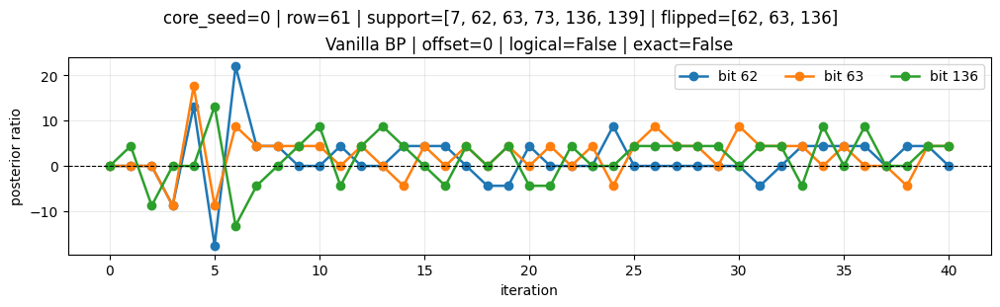

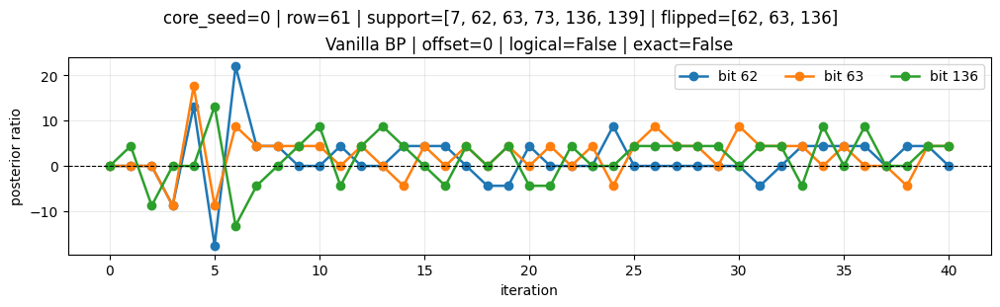

In [4]:
experiment_bp_seed0 = run_decoder_experiment(core_seed_zero, "bp", code_data, hz_check_matrix)
display(experiment_bp_seed0["summary"])
display(experiment_bp_seed0["coefficients"])
experiment_bp_seed0["figure"]


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,0,22,True,True,False,0,edge_message,0.75,0.75


,coeff_seed_offset,coeff_seed,min,max,mean,std,nontrivial_edges,damping_mode,damping_min,damping_max
0,0,0,0.75,0.75,0.75,0.0,432,edge_message,0.75,0.75


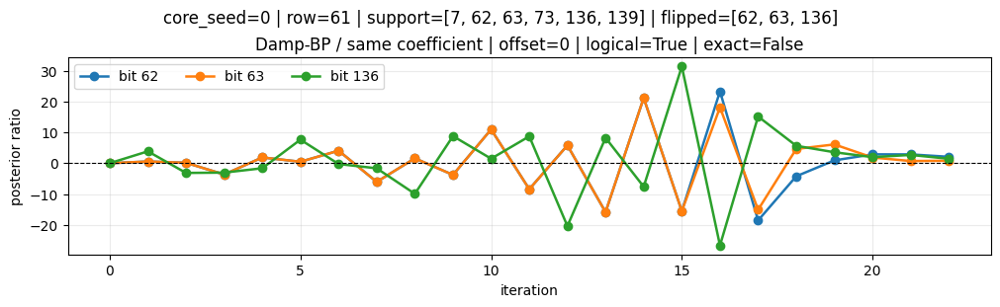

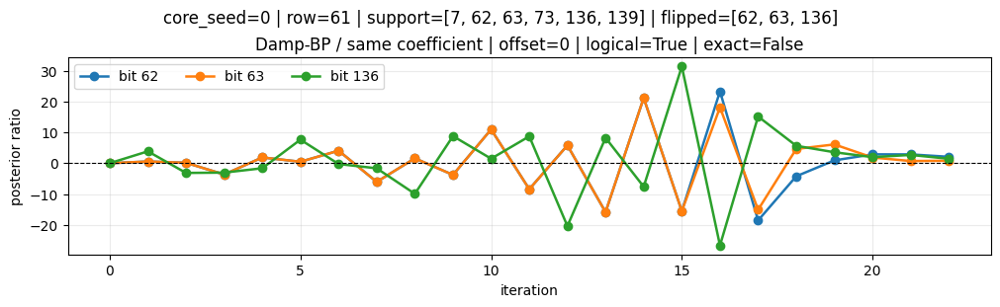

In [5]:
experiment_damp_same_seed0 = run_decoder_experiment(core_seed_zero, "damp_same", code_data, hz_check_matrix)
display(experiment_damp_same_seed0["summary"])
display(experiment_damp_same_seed0["coefficients"])
experiment_damp_same_seed0["figure"]


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,0.500150,0.998605,0.766665,0.147453,432,damp_random_all_edges,Damp-BP / random interval on all edges,0,0,11,True,True,False,0,edge_message,0.500150,0.998605
1,0.501044,0.998069,0.744406,0.136227,432,damp_random_all_edges,Damp-BP / random interval on all edges,1,10000,7,True,True,False,0,edge_message,0.501044,0.998069
2,0.500346,0.998089,0.746688,0.148433,432,damp_random_all_edges,Damp-BP / random interval on all edges,2,20000,9,True,True,True,0,edge_message,0.500346,0.998089


,coeff_seed_offset,coeff_seed,min,max,mean,std,nontrivial_edges,damping_mode,damping_min,damping_max
0,0,0,0.500150,0.998605,0.766665,0.147453,432,edge_message,0.500150,0.998605
1,1,10000,0.501044,0.998069,0.744406,0.136227,432,edge_message,0.501044,0.998069
2,2,20000,0.500346,0.998089,0.746688,0.148433,432,edge_message,0.500346,0.998089


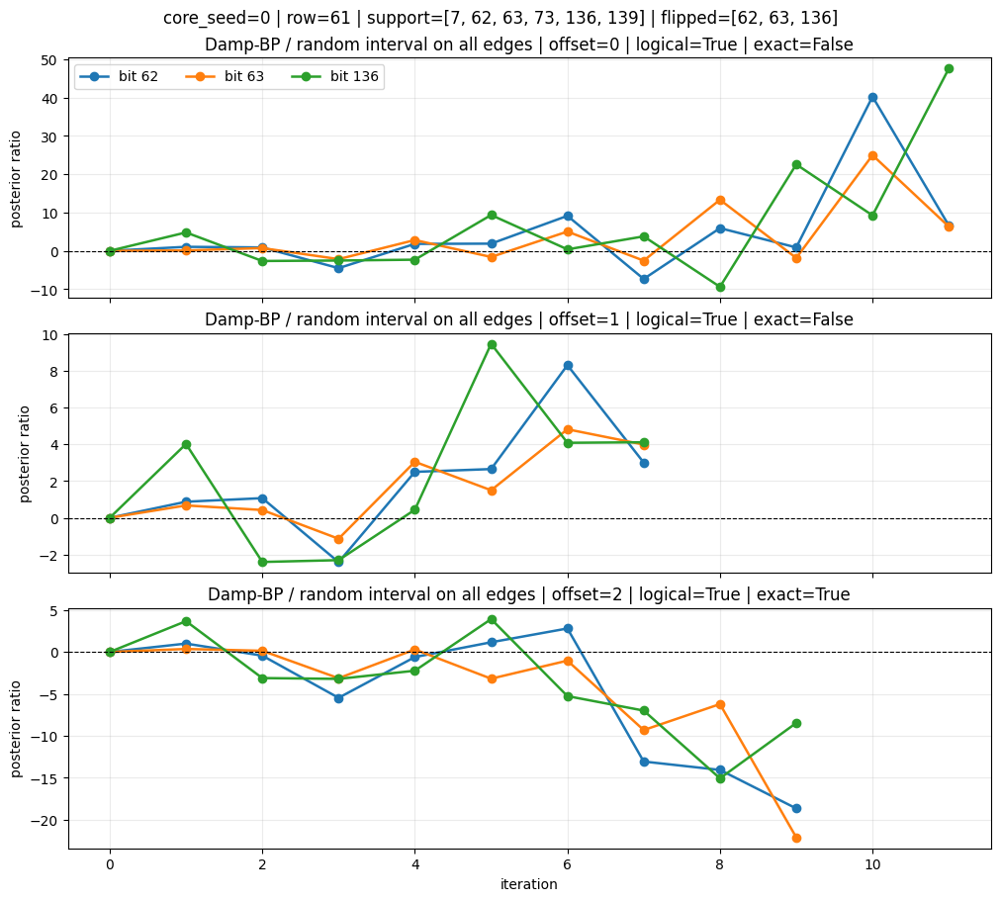

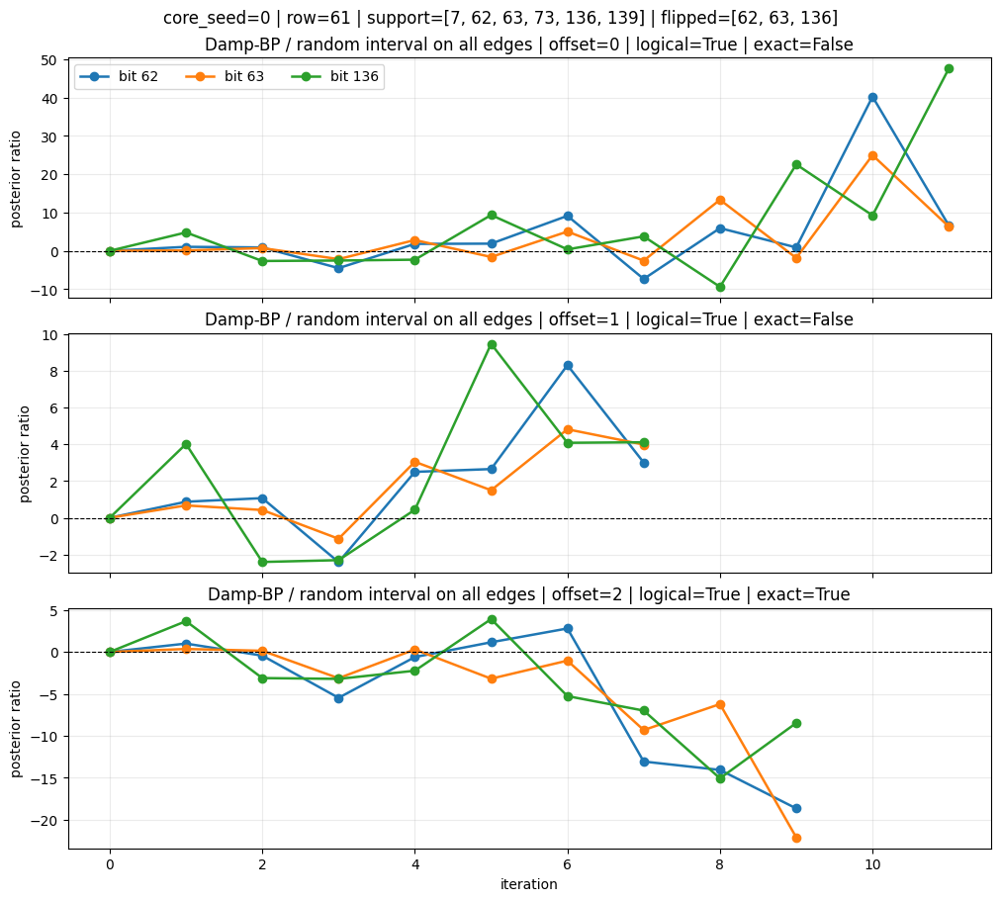

In [6]:
experiment_damp_random_all_edges_seed0 = run_decoder_experiment(core_seed_zero, "damp_random_all_edges", code_data, hz_check_matrix)
display(experiment_damp_random_all_edges_seed0["summary"])
display(experiment_damp_random_all_edges_seed0["coefficients"])
experiment_damp_random_all_edges_seed0["figure"]


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,0.501369,1.0,0.990191,0.058099,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,0,0,7,True,True,False,0,edge_message,0.501369,1.0
1,0.584954,1.0,0.988020,0.061506,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,1,10000,6,True,True,True,0,edge_message,0.584954,1.0
2,0.506504,1.0,0.988751,0.063500,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,2,20000,15,True,True,False,0,edge_message,0.506504,1.0


,coeff_seed_offset,coeff_seed,min,max,mean,std,nontrivial_edges,damping_mode,damping_min,damping_max
0,0,0,0.501369,1.0,0.990191,0.058099,18,edge_message,0.501369,1.0
1,1,10000,0.584954,1.0,0.988020,0.061506,18,edge_message,0.584954,1.0
2,2,20000,0.506504,1.0,0.988751,0.063500,18,edge_message,0.506504,1.0


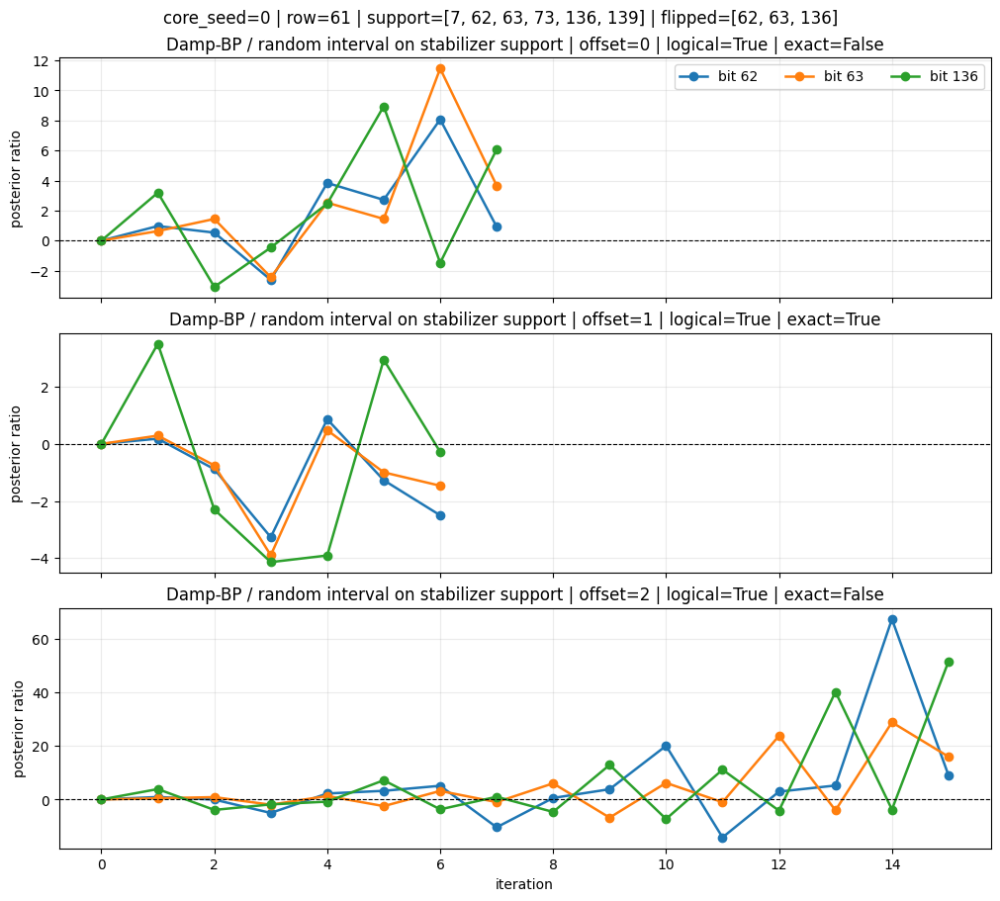

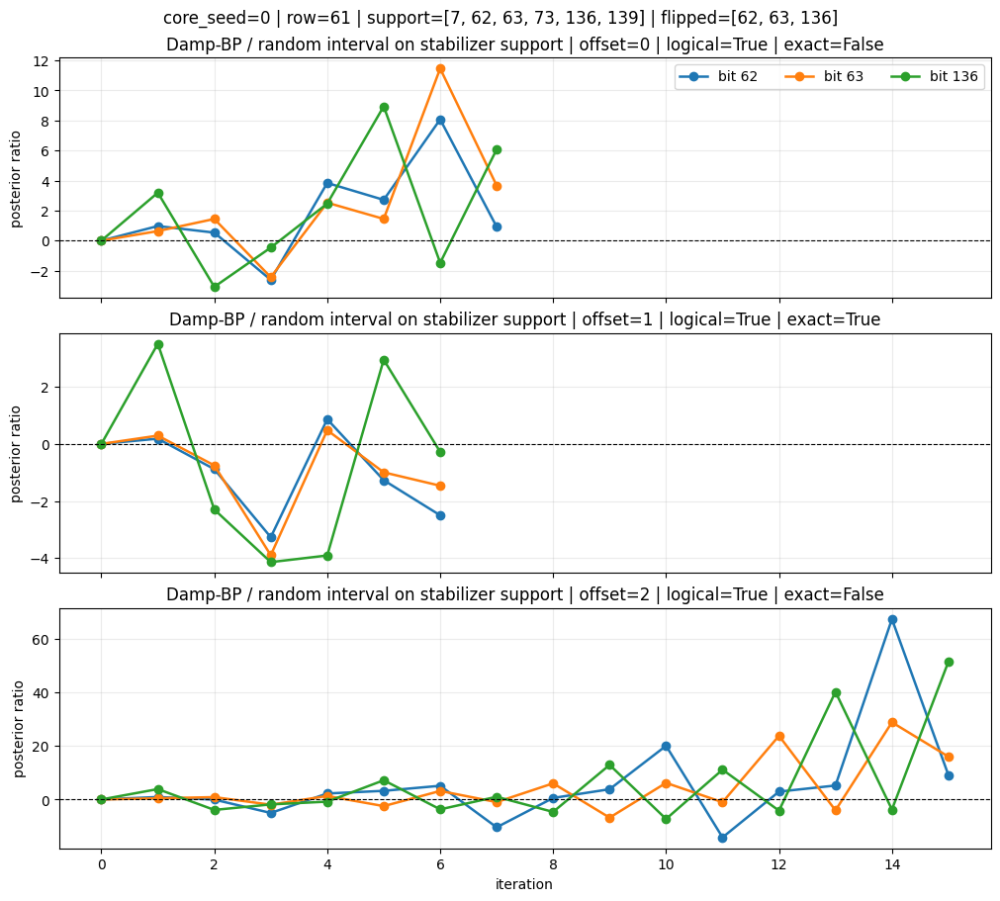

In [7]:
experiment_damp_random_support_only_seed0 = run_decoder_experiment(core_seed_zero, "damp_random_support_only", code_data, hz_check_matrix)
display(experiment_damp_random_support_only_seed0["summary"])
display(experiment_damp_random_support_only_seed0["coefficients"])
experiment_damp_random_support_only_seed0["figure"]


## Core Seeds 1 To 10


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,1,40,False,False,False,8,none,None,None
1,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,2,40,False,False,False,9,none,None,None
2,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,3,40,False,False,False,4,none,None,None
3,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,4,40,False,False,False,7,none,None,None
4,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,5,40,False,False,False,2,none,None,None
5,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,6,40,False,False,False,6,none,None,None
6,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,7,40,False,False,False,3,none,None,None
7,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,8,40,False,False,False,6,none,None,None
8,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,9,40,False,False,False,4,none,None,None
9,NaN,NaN,NaN,NaN,0,bp,Vanilla BP,0,10,40,False,False,False,2,none,None,None


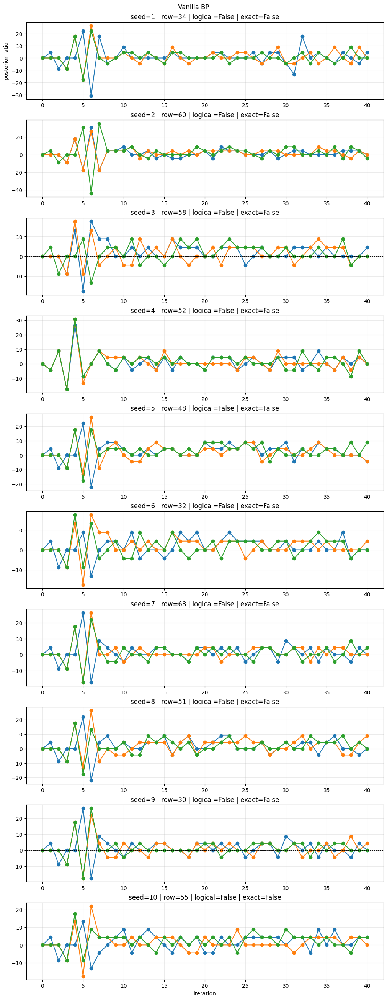

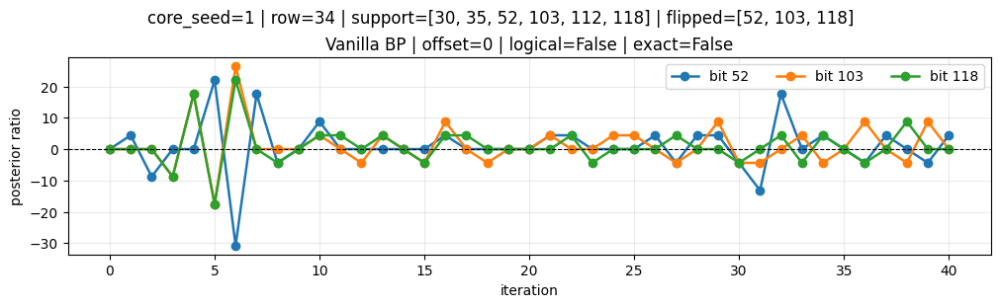

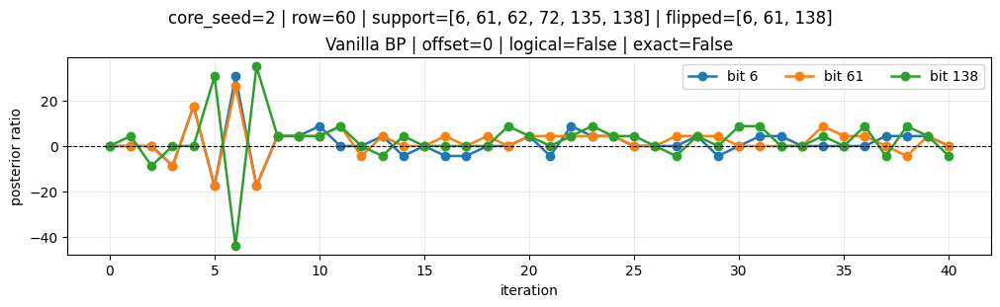

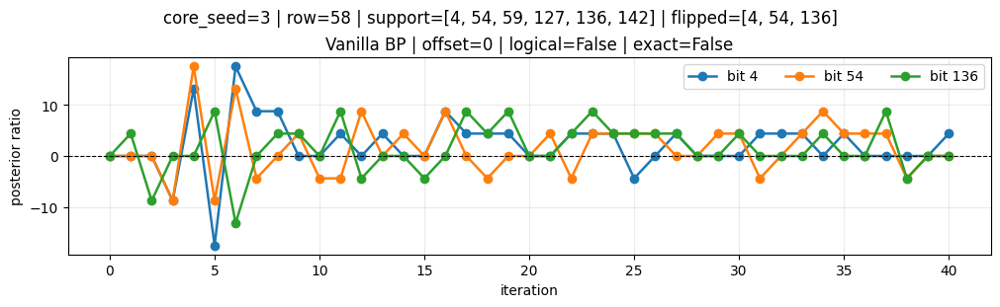

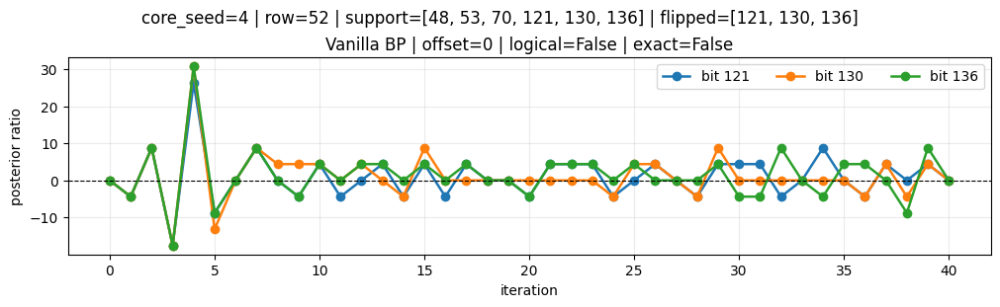

...

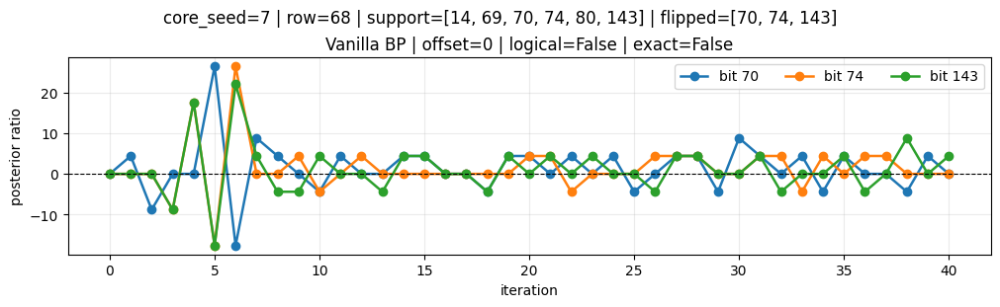

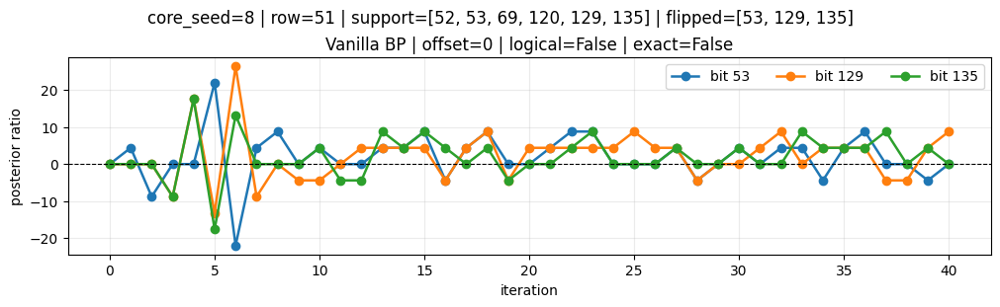

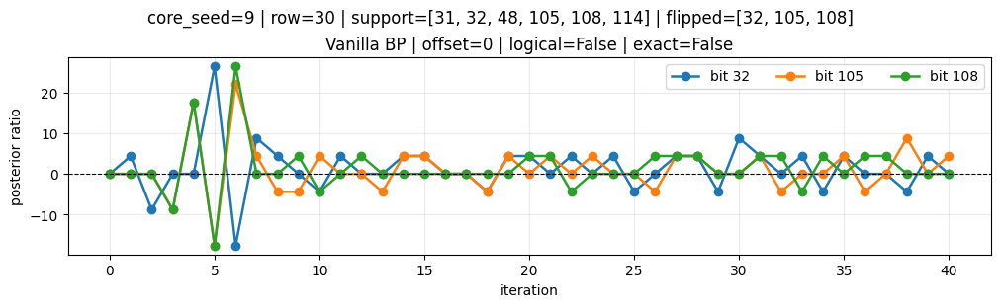

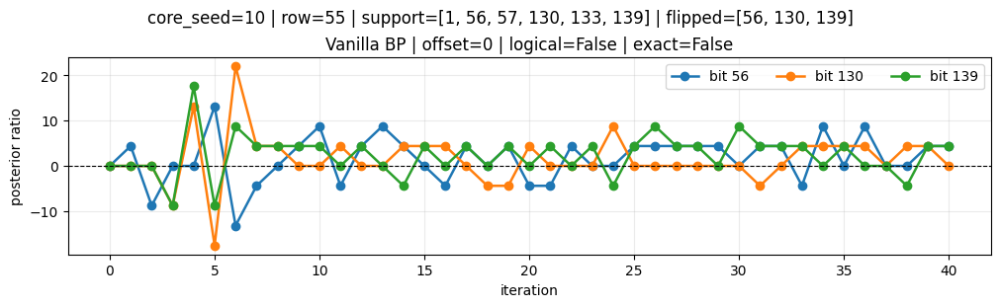

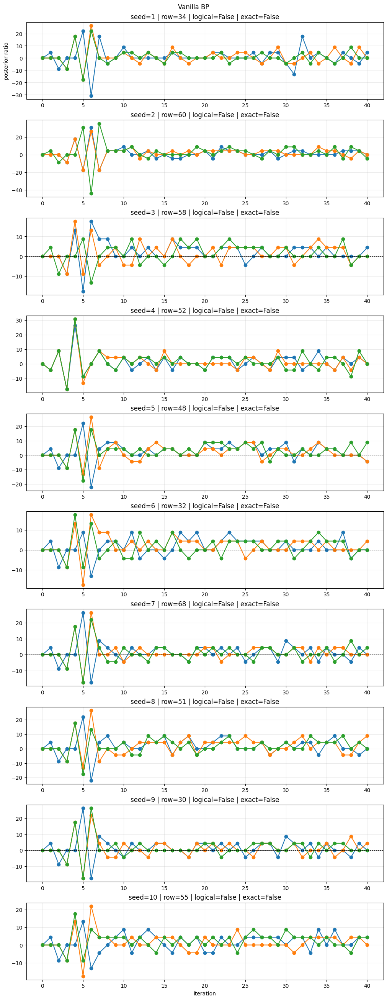

In [8]:
experiments_bp_grid, coeffs_bp_grid, fig_bp_grid = plot_seed_grid("bp", core_seed_grid, code_data, hz_check_matrix)
display(coeffs_bp_grid.head(20))
fig_bp_grid


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,1,40,False,True,False,0,edge_message,0.75,0.75
1,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,2,32,True,True,True,0,edge_message,0.75,0.75
2,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,3,22,True,True,True,0,edge_message,0.75,0.75
3,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,4,40,False,True,False,0,edge_message,0.75,0.75
4,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,5,24,True,True,True,0,edge_message,0.75,0.75
5,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,6,22,True,True,True,0,edge_message,0.75,0.75
6,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,7,40,False,False,False,5,edge_message,0.75,0.75
7,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,8,24,True,True,False,0,edge_message,0.75,0.75
8,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,9,40,False,False,False,3,edge_message,0.75,0.75
9,0.75,0.75,0.75,0.0,432,damp_same,Damp-BP / same coefficient,0,10,22,True,True,False,0,edge_message,0.75,0.75


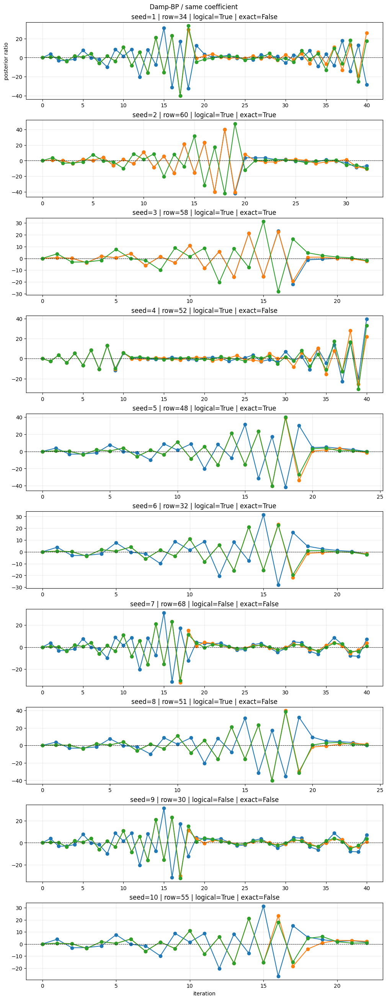

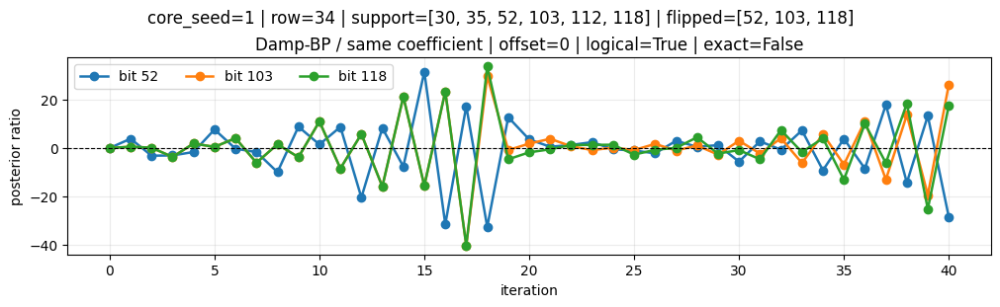

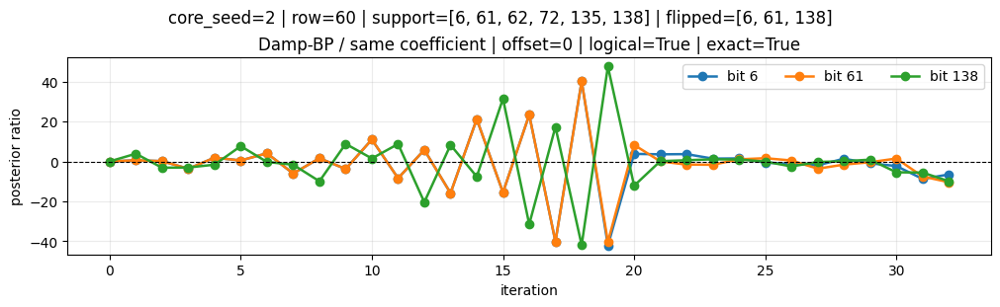

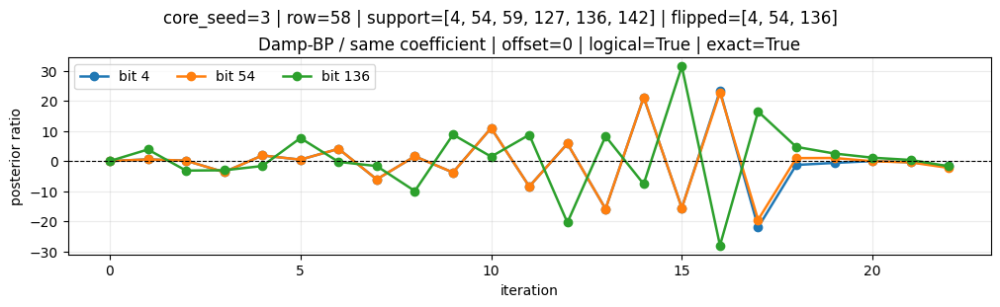

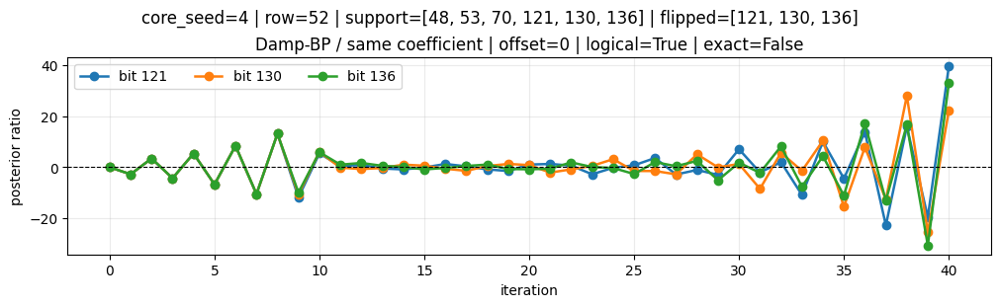

...

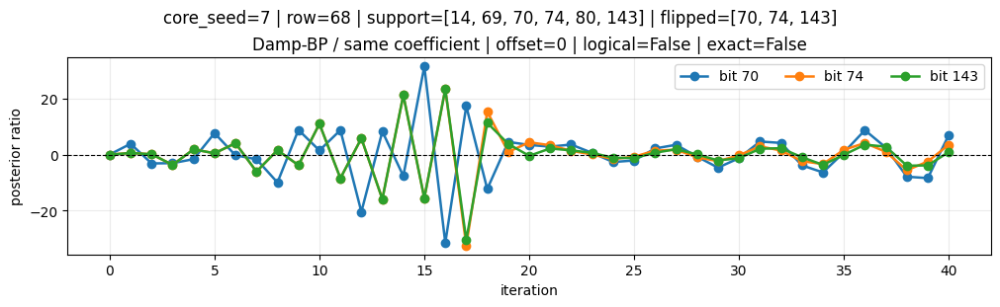

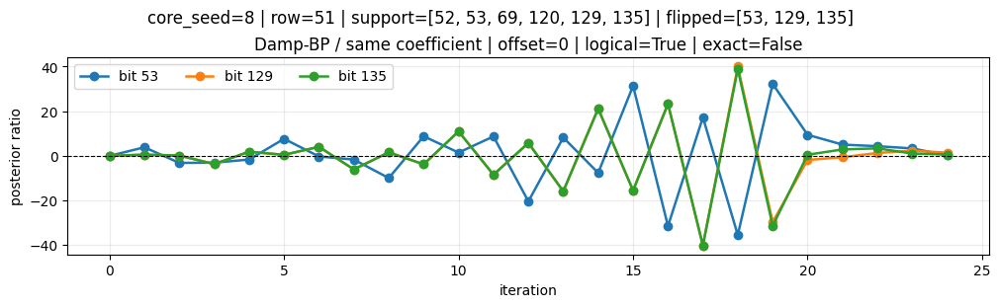

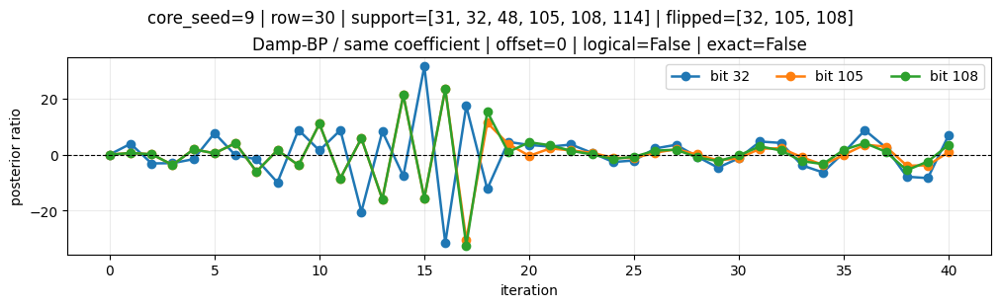

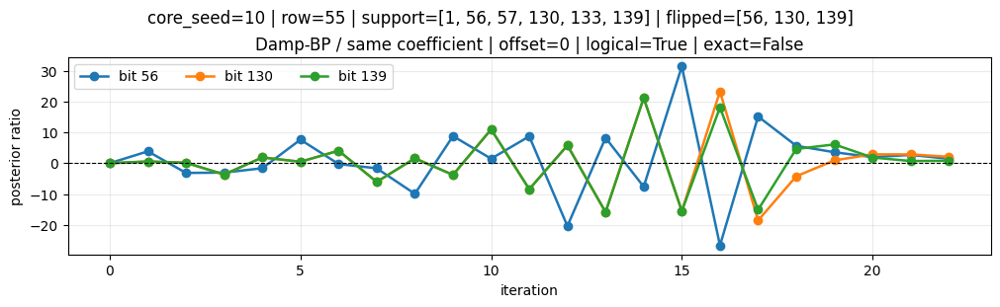

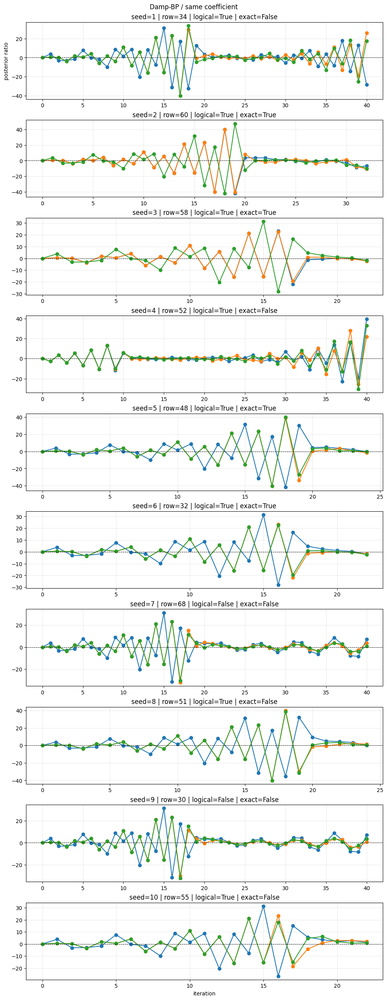

In [9]:
experiments_damp_same_grid, coeffs_damp_same_grid, fig_damp_same_grid = plot_seed_grid("damp_same", core_seed_grid, code_data, hz_check_matrix)
display(coeffs_damp_same_grid.head(20))
fig_damp_same_grid


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,0.501374,0.999513,0.742892,0.142602,432,damp_random_all_edges,Damp-BP / random interval on all edges,0,1,7,True,True,False,0,edge_message,0.501374,0.999513
1,0.501767,0.999781,0.747606,0.148915,432,damp_random_all_edges,Damp-BP / random interval on all edges,1,10001,13,True,True,True,0,edge_message,0.501767,0.999781
2,0.500146,0.999769,0.747687,0.142254,432,damp_random_all_edges,Damp-BP / random interval on all edges,2,20001,12,True,True,True,0,edge_message,0.500146,0.999769
3,0.501593,0.999979,0.745784,0.144774,432,damp_random_all_edges,Damp-BP / random interval on all edges,0,2,6,True,True,False,0,edge_message,0.501593,0.999979
4,0.500355,0.998691,0.747009,0.139412,432,damp_random_all_edges,Damp-BP / random interval on all edges,1,10002,12,True,True,False,0,edge_message,0.500355,0.998691
5,0.503513,0.999984,0.744821,0.149757,432,damp_random_all_edges,Damp-BP / random interval on all edges,2,20002,7,True,True,True,0,edge_message,0.503513,0.999984
6,0.500574,0.999902,0.749856,0.139300,432,damp_random_all_edges,Damp-BP / random interval on all edges,0,3,11,True,True,True,0,edge_message,0.500574,0.999902
7,0.500513,0.999031,0.761945,0.145848,432,damp_random_all_edges,Damp-BP / random interval on all edges,1,10003,8,True,True,True,0,edge_message,0.500513,0.999031
8,0.500634,0.999757,0.751806,0.141199,432,damp_random_all_edges,Damp-BP / random interval on all edges,2,20003,11,True,True,True,0,edge_message,0.500634,0.999757
9,0.501200,0.999207,0.768801,0.144893,432,damp_random_all_edges,Damp-BP / random interval on all edges,0,4,13,True,True,False,0,edge_message,0.501200,0.999207


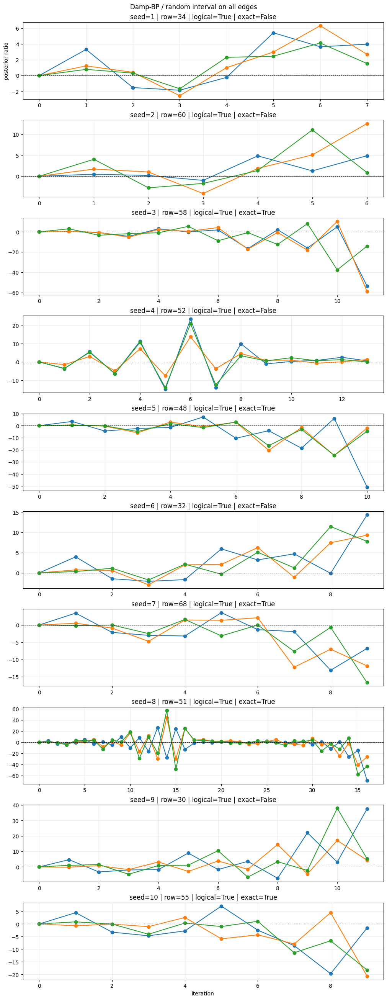

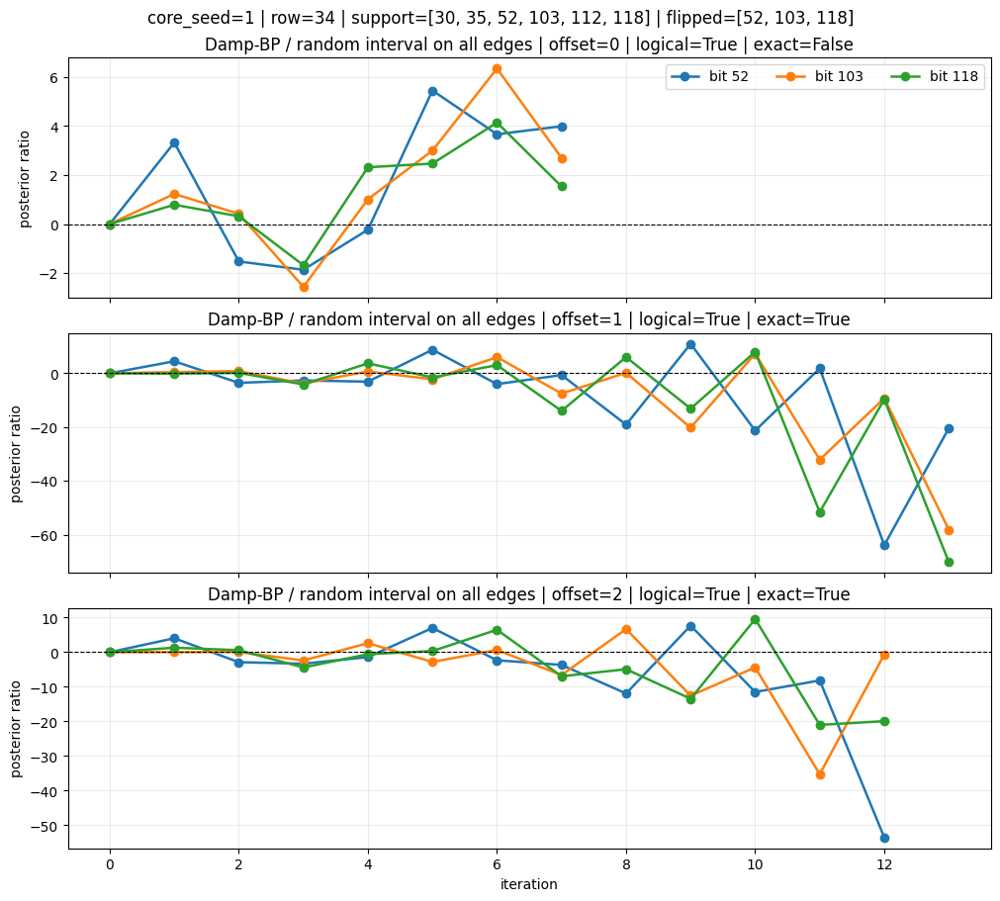

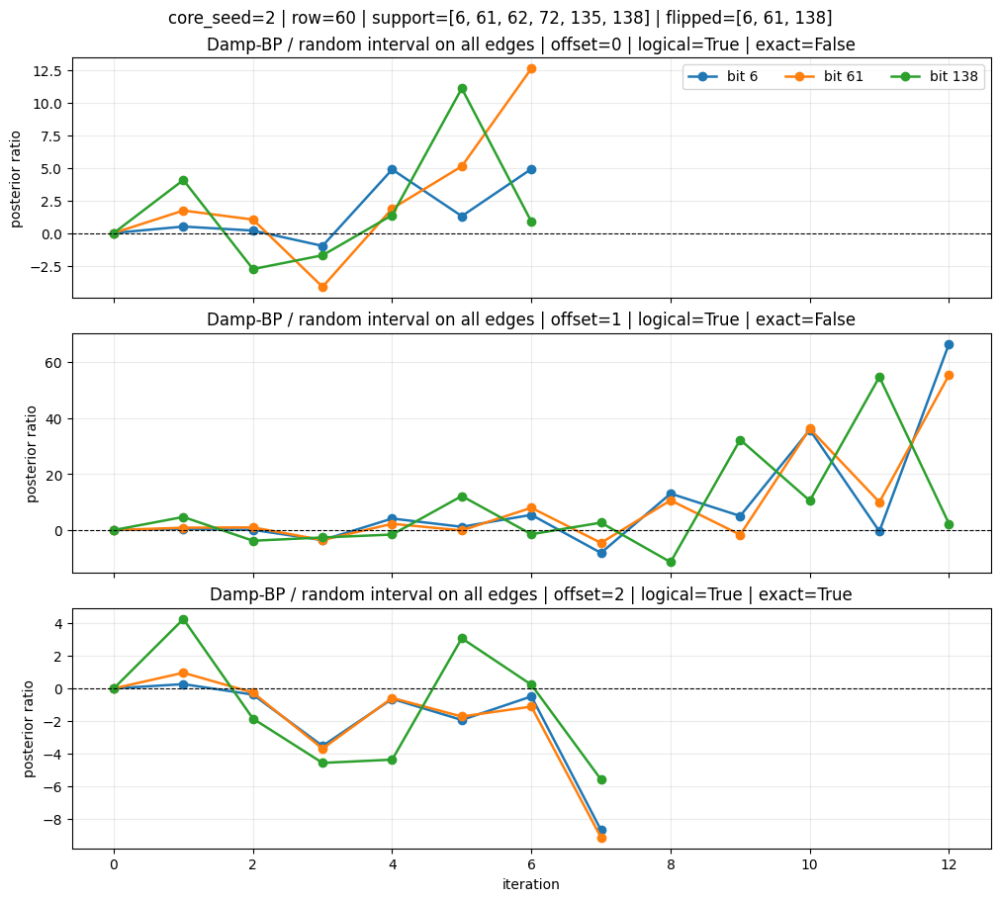

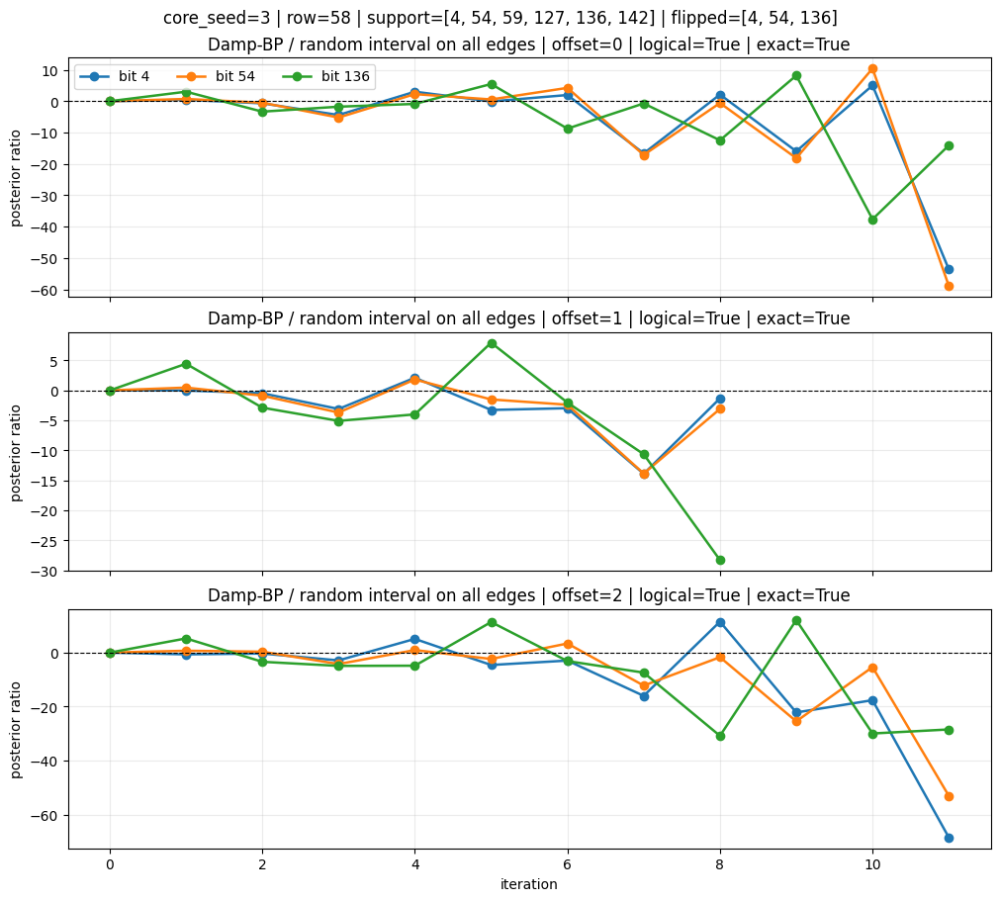

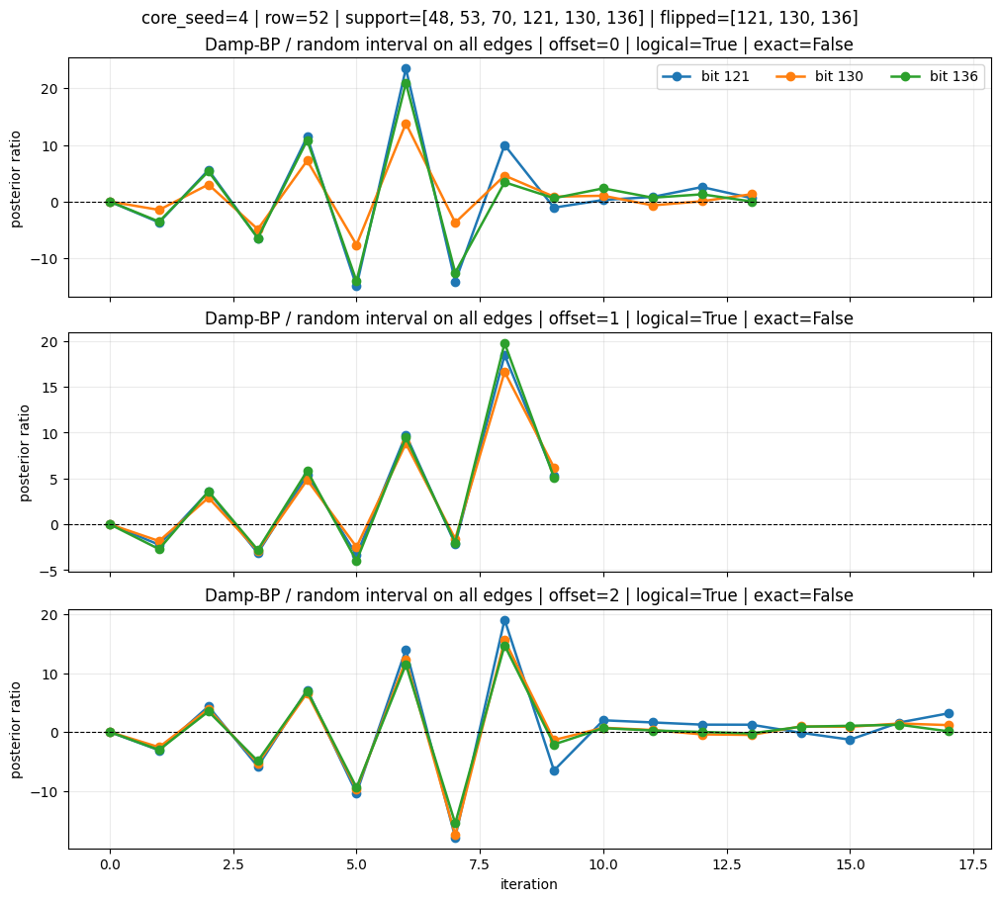

...

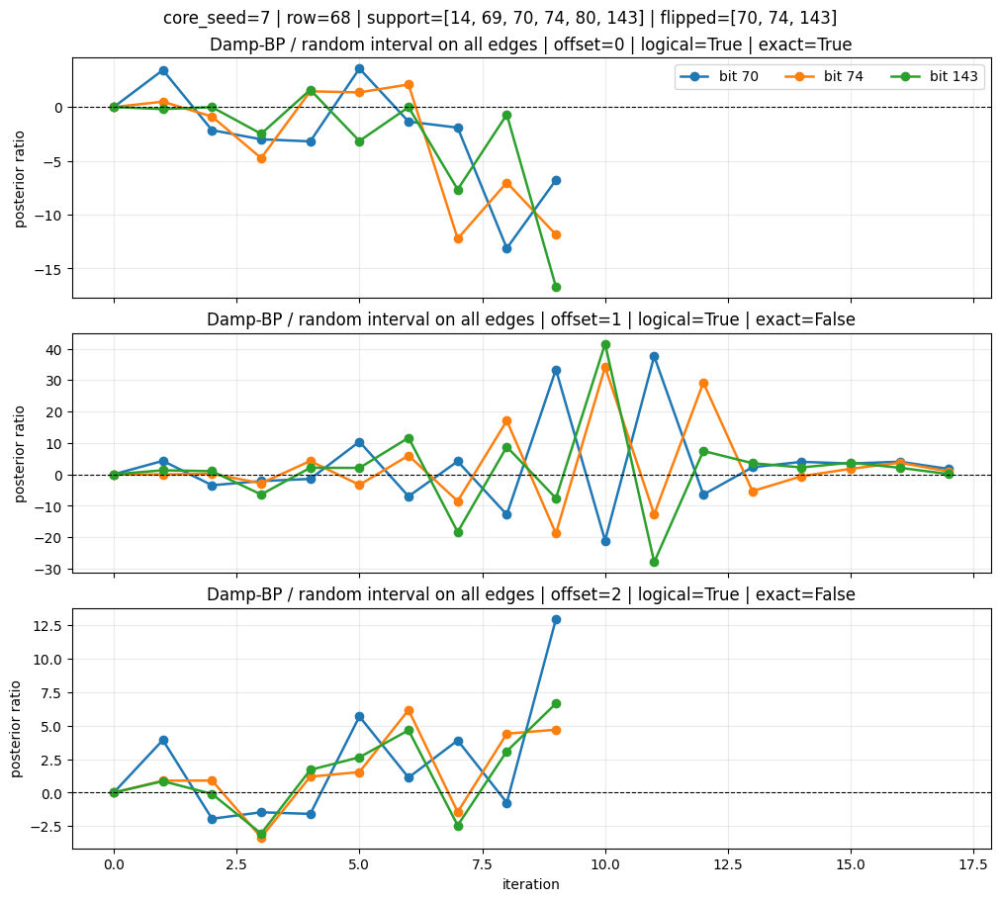

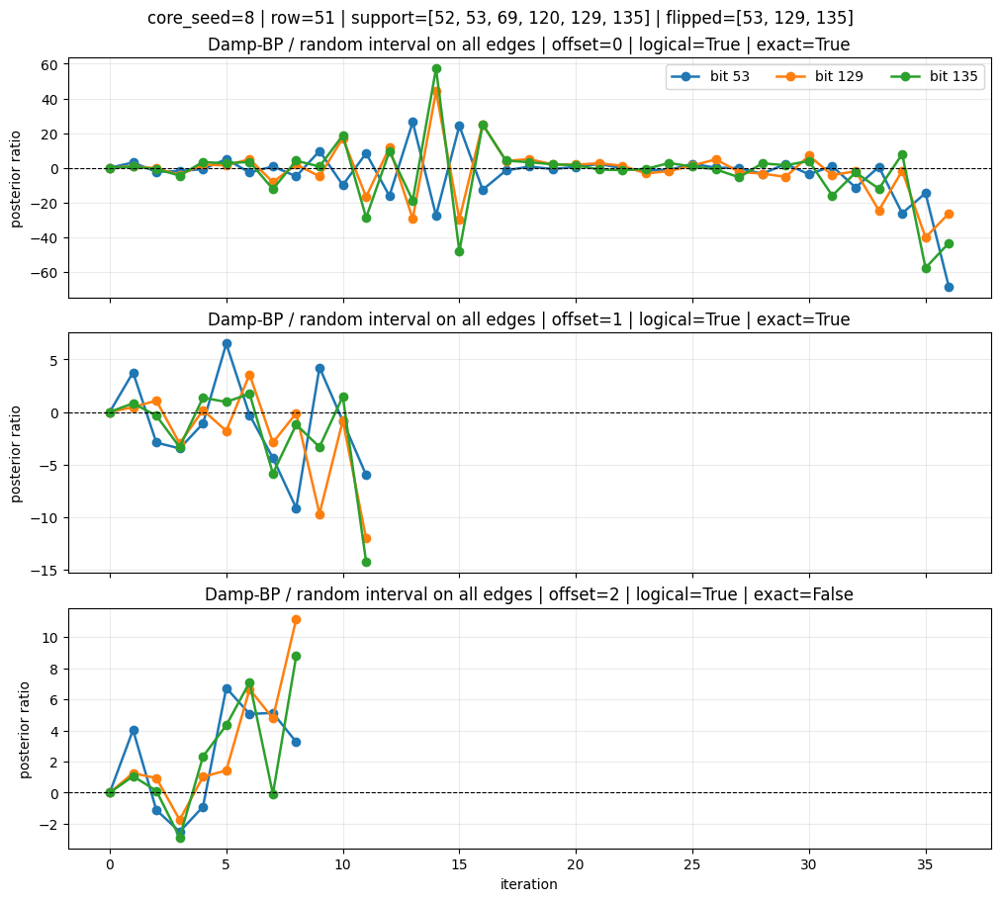

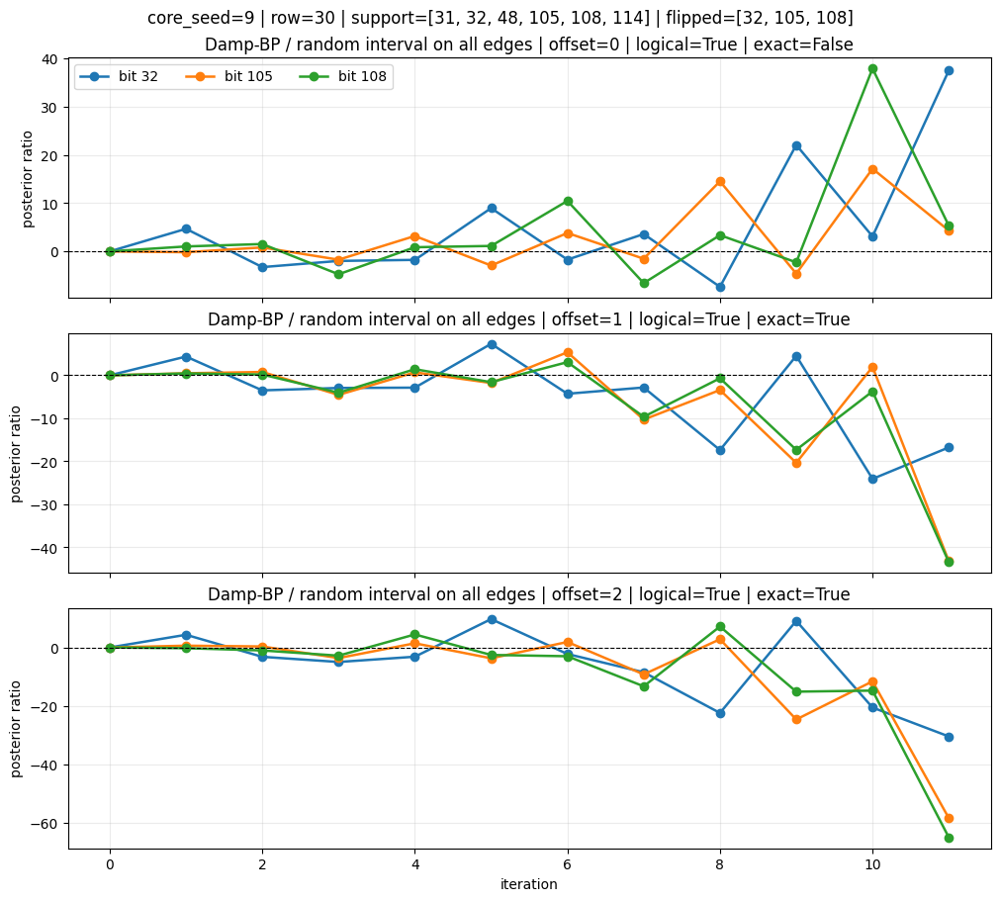

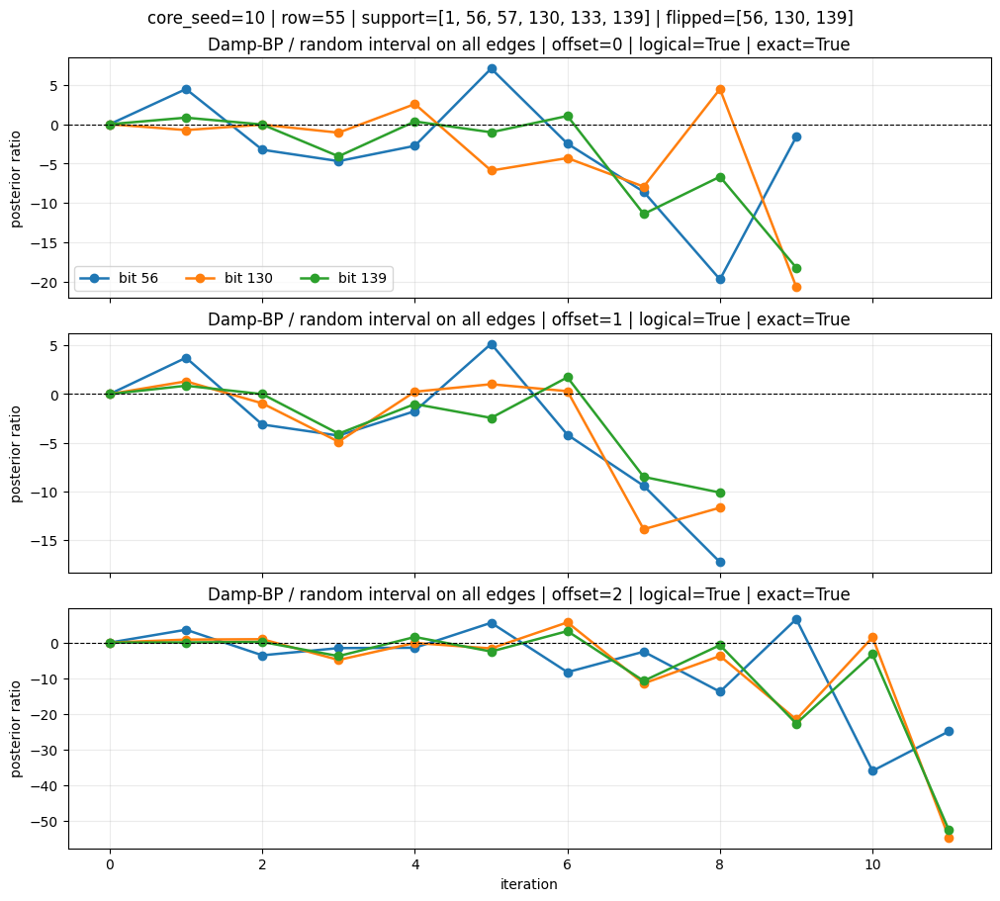

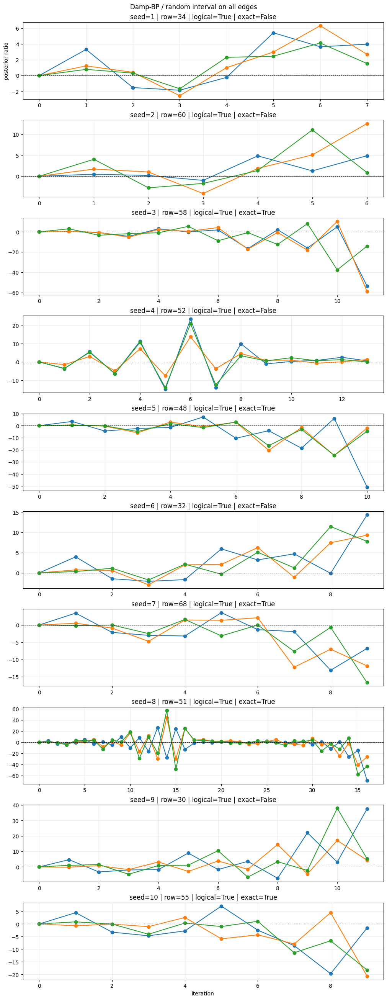

In [10]:
experiments_damp_random_all_edges_grid, coeffs_damp_random_all_edges_grid, fig_damp_random_all_edges_grid = plot_seed_grid("damp_random_all_edges", core_seed_grid, code_data, hz_check_matrix)
display(coeffs_damp_random_all_edges_grid.head(20))
fig_damp_random_all_edges_grid


,min,max,mean,std,nontrivial_edges,decoder_kind,label,coeff_seed_offset,coeff_seed,iterations,converged,logical_success,exact_recovery,logical_weight,damping_mode,damping_min,damping_max
0,0.513780,1.0,0.989361,0.057796,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,0,1,13,True,True,False,0,edge_message,0.513780,1.0
1,0.503427,1.0,0.989848,0.056772,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,1,10001,10,True,True,True,0,edge_message,0.503427,1.0
2,0.502532,1.0,0.991190,0.051790,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,2,20001,9,True,True,True,0,edge_message,0.502532,1.0
3,0.527573,1.0,0.988994,0.059075,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,0,2,15,True,True,True,0,edge_message,0.527573,1.0
4,0.504060,1.0,0.990585,0.052947,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,1,10002,7,True,True,False,0,edge_message,0.504060,1.0
5,0.510900,1.0,0.990112,0.056726,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,2,20002,12,True,True,False,0,edge_message,0.510900,1.0
6,0.542825,1.0,0.988741,0.059873,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,0,3,7,True,True,True,0,edge_message,0.542825,1.0
7,0.533443,1.0,0.988644,0.059881,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,1,10003,7,True,True,True,0,edge_message,0.533443,1.0
8,0.539799,1.0,0.991142,0.050063,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,2,20003,10,True,True,True,0,edge_message,0.539799,1.0
9,0.540418,1.0,0.992752,0.045262,18,damp_random_support_only,Damp-BP / random interval on stabilizer support,0,4,15,True,True,True,0,edge_message,0.540418,1.0


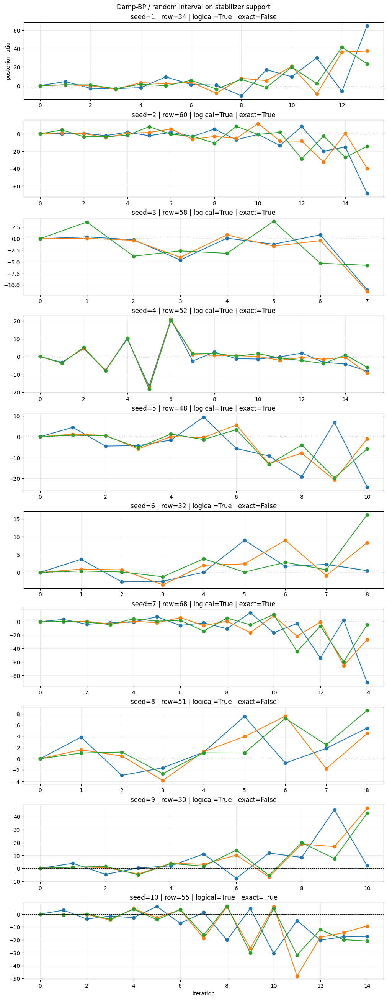

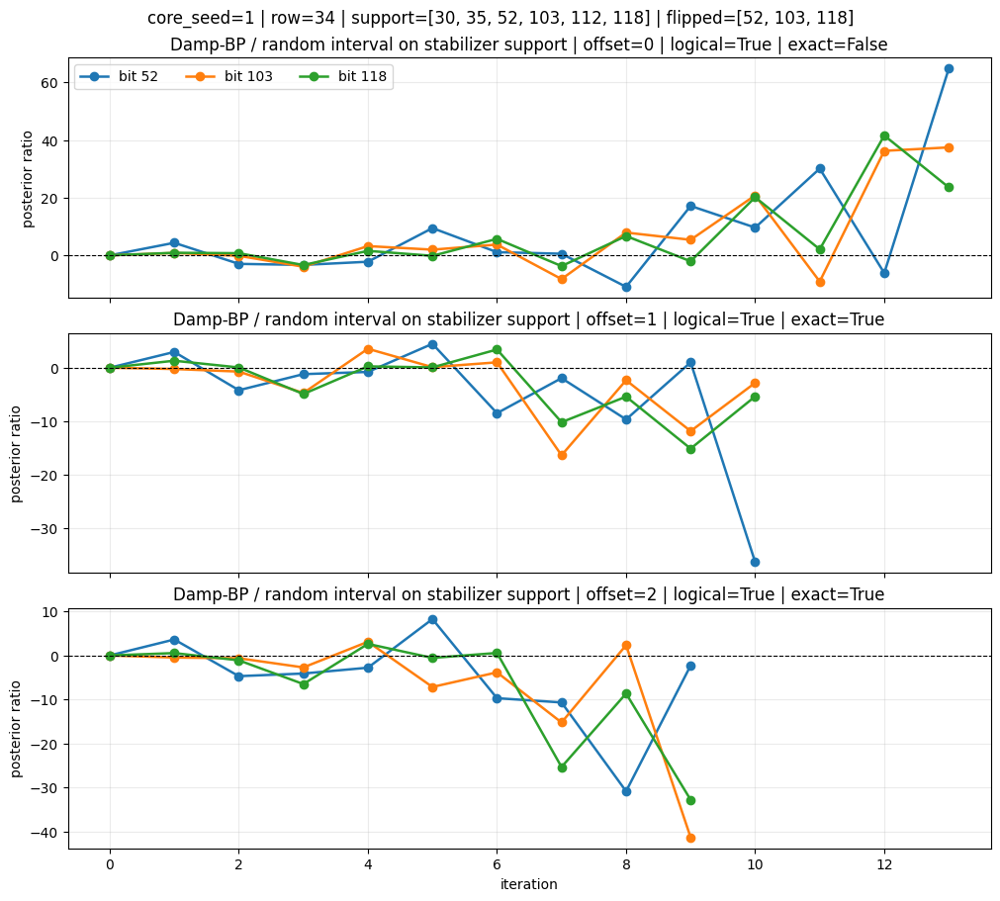

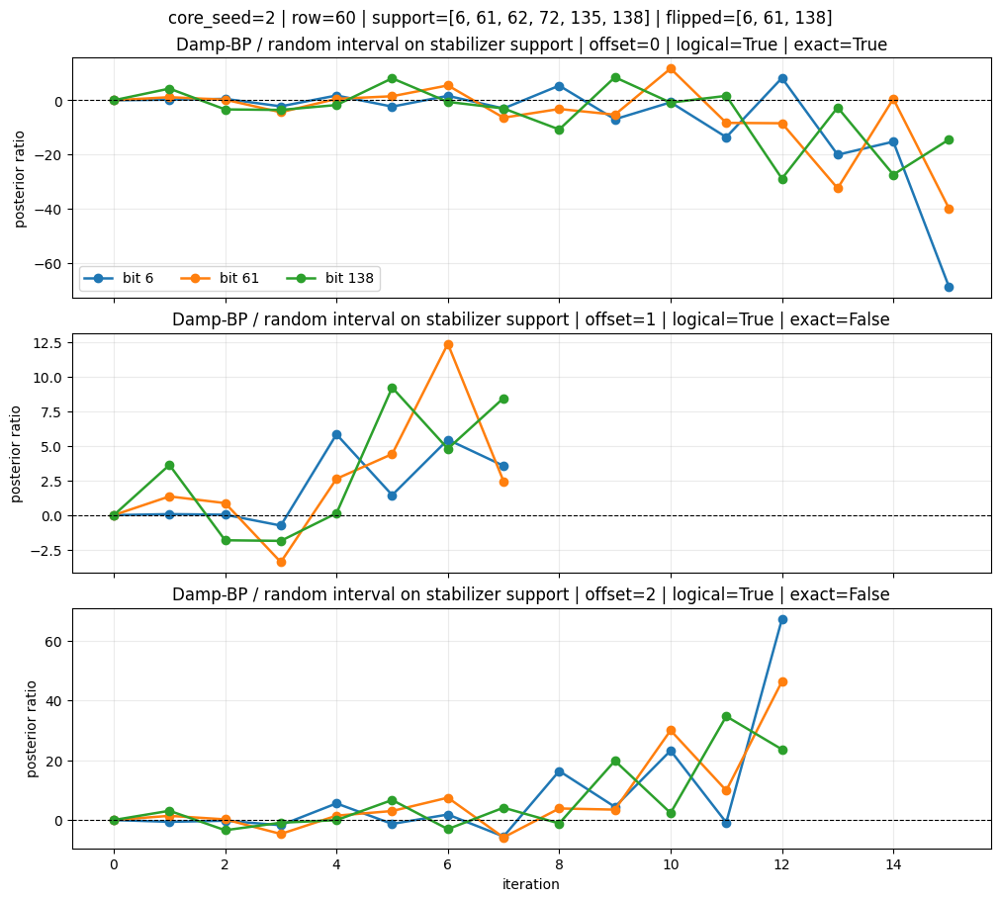

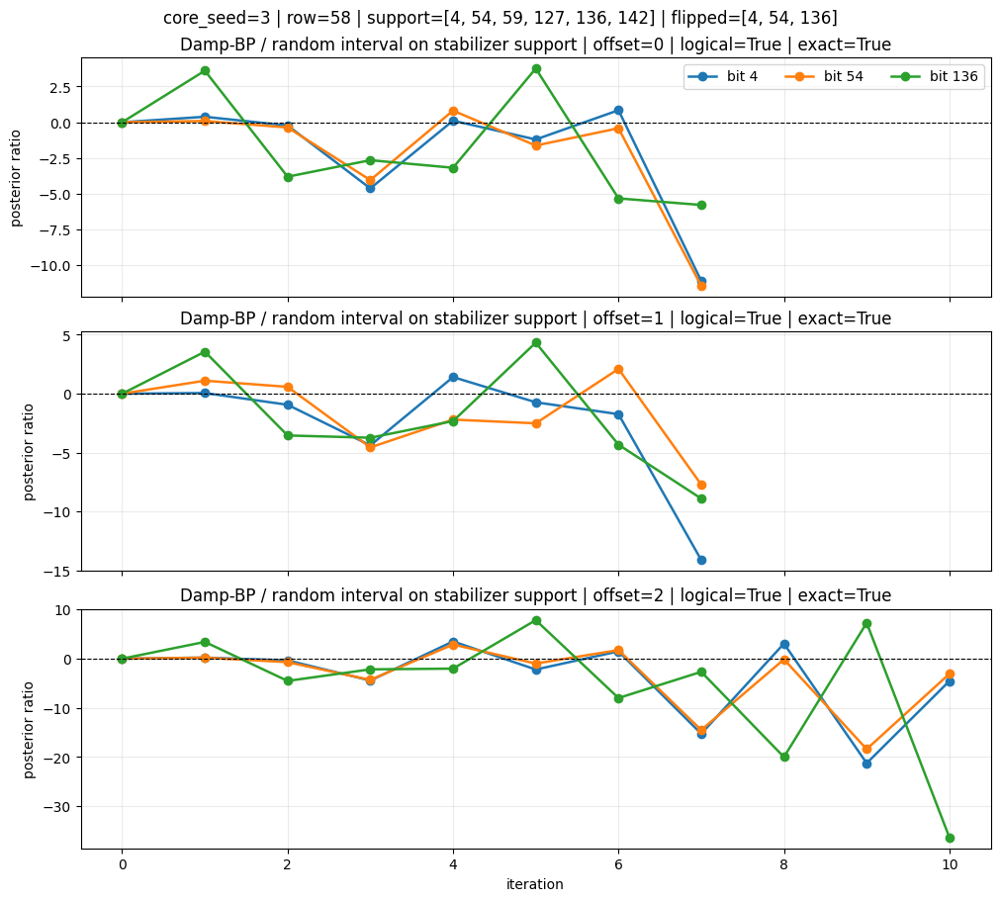

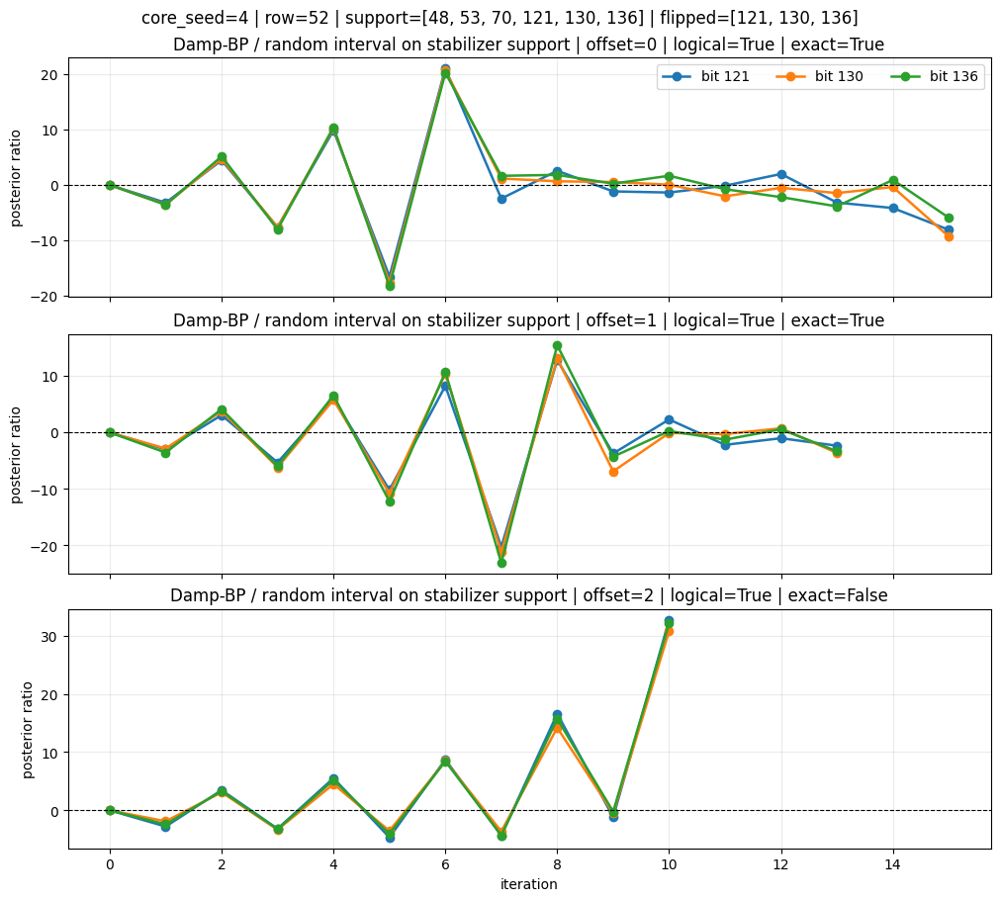

...

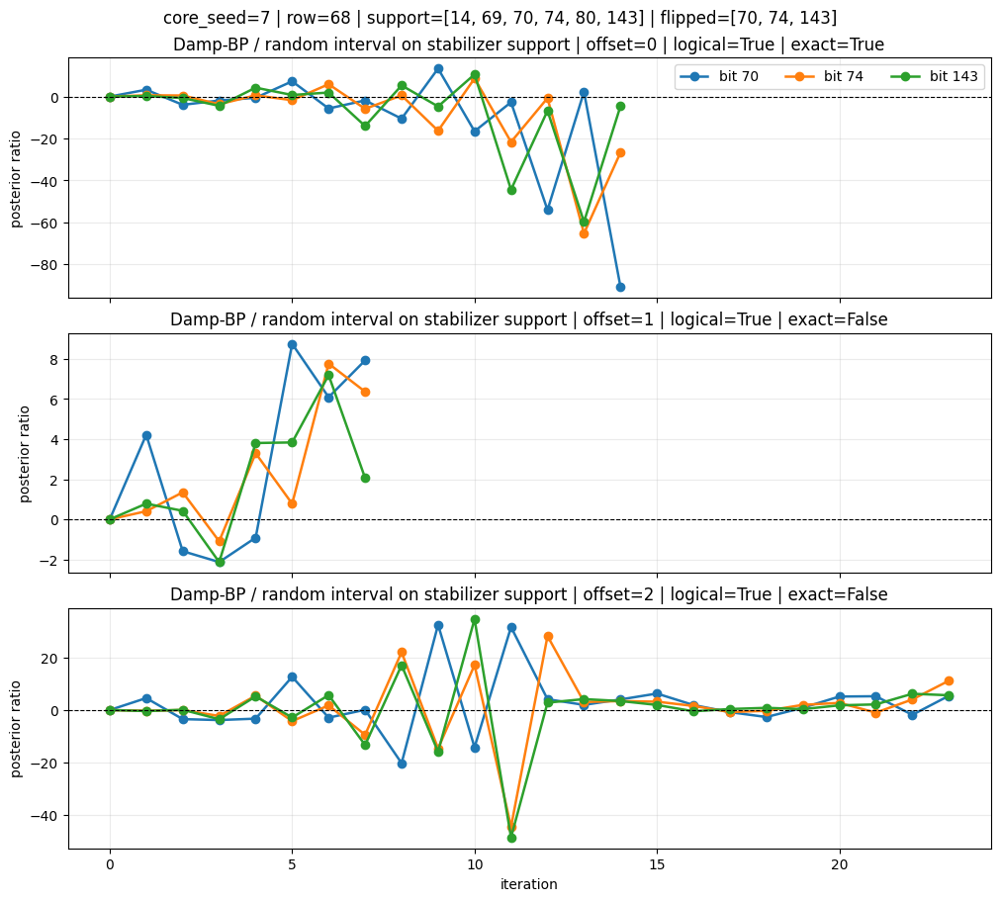

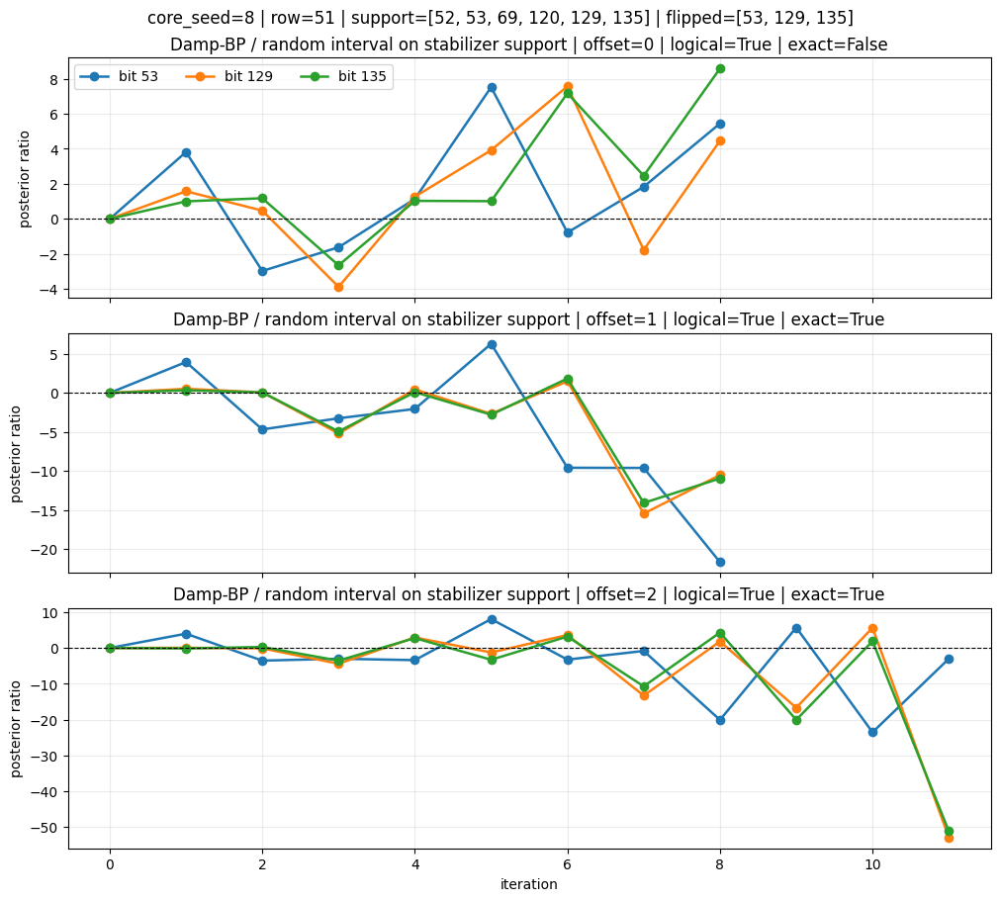

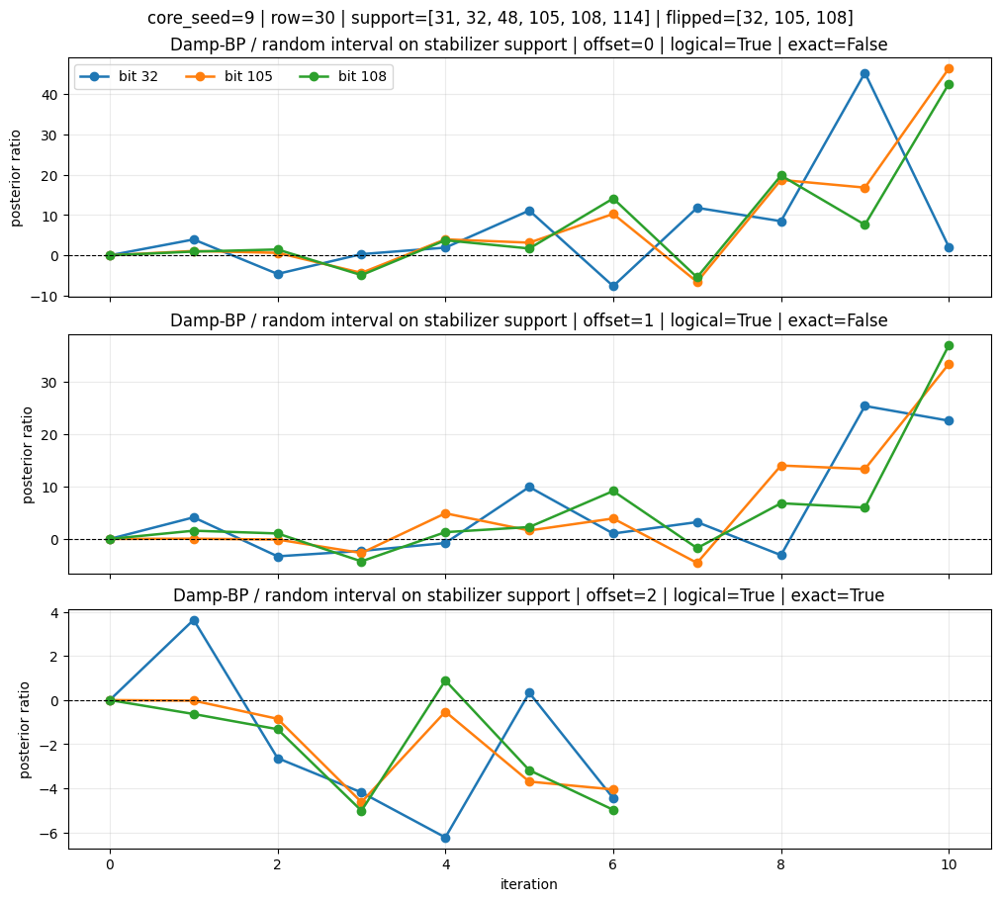

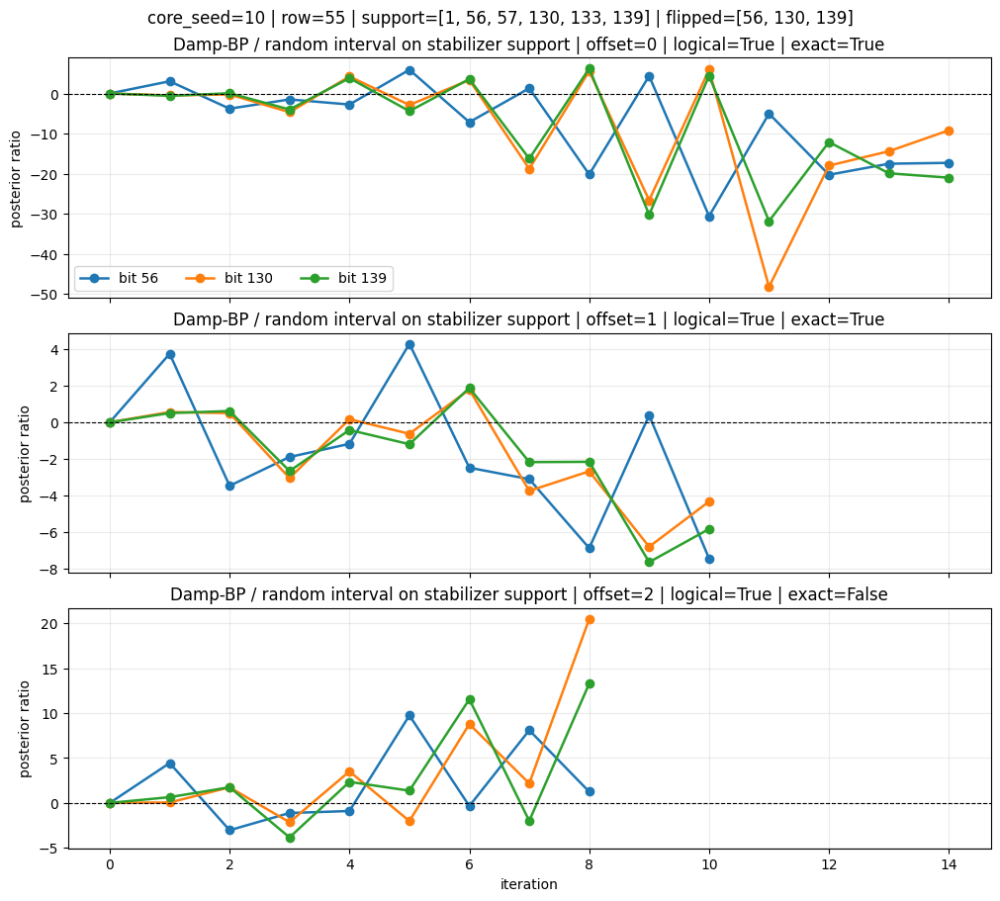

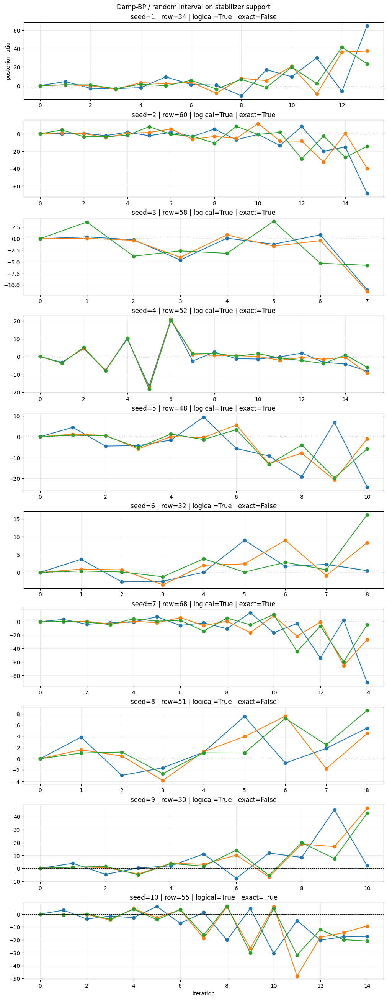

In [11]:
experiments_damp_random_support_only_grid, coeffs_damp_random_support_only_grid, fig_damp_random_support_only_grid = plot_seed_grid("damp_random_support_only", core_seed_grid, code_data, hz_check_matrix)
display(coeffs_damp_random_support_only_grid.head(20))
fig_damp_random_support_only_grid


## Optional Extension

The extra check I like here is a direct same-seed comparison between global edge disorder and support-local disorder with the same coefficient offsets. That isolates whether the local placement of the disorder matters more than the interval itself.


In [13]:
extension_rows = []
for all_row, local_row in zip(
    experiment_damp_random_all_edges_seed0["summary"].to_dict(orient="records"),
    experiment_damp_random_support_only_seed0["summary"].to_dict(orient="records"),
):
    extension_rows.append(
        {
            "coeff_seed_offset": int(all_row["coeff_seed_offset"]),
            "all_edges_logical_success": bool(all_row["logical_success"]),
            "support_only_logical_success": bool(local_row["logical_success"]),
            "all_edges_exact_recovery": bool(all_row["exact_recovery"]),
            "support_only_exact_recovery": bool(local_row["exact_recovery"]),
            "all_edges_nontrivial_edges": int(all_row["nontrivial_edges"]),
            "support_only_nontrivial_edges": int(local_row["nontrivial_edges"]),
        }
    )
display(pd.DataFrame(extension_rows))


,coeff_seed_offset,all_edges_logical_success,support_only_logical_success,all_edges_exact_recovery,support_only_exact_recovery,all_edges_nontrivial_edges,support_only_nontrivial_edges
0,0,True,True,False,False,432,18
1,1,True,True,False,True,432,18
2,2,True,True,True,False,432,18
